In [1]:
####################### Import librairies #######################

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import statsmodels.api 
import pickle
from joblib import dump, load
from keras.models import load_model

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import f_regression
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import tensorflow as tf

%matplotlib inline
pd.set_option('display.max_columns', None)
sns.set_theme()

# 1. Datas processing

First, we need to check and process the data.

In [2]:
####################### Import raw datas #######################

energy = pd.read_csv('energy_dataset.csv')
weather = pd.read_csv('weather_features.csv')

####################### delete duplicates of weather #######################

# 24 values per day on 4 years (2015 - 2018) : 35064 total values for df energy.
# Same goes per city on df weather.

# Values count per city
weather.city_name.value_counts()

# Deleting duplicates for each city
weather = weather.drop_duplicates(subset = ['city_name','dt_iso'])

####################### Daylight Saving Time #######################

# We are going to delete values in october, and add 'artificial' values in march, in order
# to deal with Daylight Saving Time
# New values added will be the same as H+1

# DF ENERGY
# deleting lines
energy.drop(energy.index[(energy.time == '2015-10-25 02:00:00+01:00') |
                  (energy.time == '2016-10-30 02:00:00+01:00') |
                  (energy.time == '2017-10-29 02:00:00+01:00') |
                  (energy.time == '2018-10-28 02:00:00+01:00')],
            axis=0,inplace=True)

energy = energy.sort_index().reset_index(drop=True)

# adding rows
line = energy[28295:28296]
energy = energy.append(line, ignore_index=False)
energy = energy.sort_index().reset_index(drop=True)
energy.iat[28295,0] = '2018-03-25 02:00:00+02:00'

line = energy[19560:19561]
energy = energy.append(line, ignore_index=False)
energy = energy.sort_index().reset_index(drop=True)
energy.iat[19560,0] = '2017-03-26 02:00:00+02:00'

line = energy[10825:10826]
energy = energy.append(line, ignore_index=False)
energy = energy.sort_index().reset_index(drop=True)
energy.iat[10825,0] = '2016-03-27 02:00:00+02:00'

line = energy[2090:2091]
energy = energy.append(line, ignore_index=False)
energy = energy.sort_index().reset_index(drop=True)
energy.iat[2090,0] = '2015-03-29 02:00:00+02:00'

# DF WEATHER
# deleting lines
weather.drop(weather.index[(weather.dt_iso == '2015-10-25 02:00:00+01:00') |
                  (weather.dt_iso == '2016-10-30 02:00:00+01:00') |
                  (weather.dt_iso == '2017-10-29 02:00:00+01:00') |
                  (weather.dt_iso == '2018-10-28 02:00:00+01:00')],
            axis=0,inplace=True)

weather = weather.sort_index().reset_index(drop=True)
weather

# adding rows
for i in range(4,-1,-1):
    line = weather[28295 + i*35060:28296 + i*35060]
    weather = weather.append(line, ignore_index=False)
    weather = weather.sort_index().reset_index(drop=True)
    weather.iat[28295 + i*35060,0] = '2018-03-25 02:00:00+02:00'

    line = weather[19560 + i*35060:19561 + i*35060]
    weather = weather.append(line, ignore_index=False)
    weather = weather.sort_index().reset_index(drop=True)
    weather.iat[19560 + i*35060,0] = '2017-03-26 02:00:00+02:00'

    line = weather[10825 + i*35060:10826 + i*35060]
    weather = weather.append(line, ignore_index=False)
    weather = weather.sort_index().reset_index(drop=True)
    weather.iat[10825 + i*35060,0] = '2016-03-27 02:00:00+02:00'

    line = weather[2090 + i*35060:2091 + i*35060]
    weather = weather.append(line, ignore_index=False)
    weather = weather.sort_index().reset_index(drop=True)
    weather.iat[2090 + i*35060,0] = '2015-03-29 02:00:00+02:00'

####################### NaNs #######################

# Number of NA per column
#print(energy.isna().sum(axis = 0))
#print(weather.isna().sum(axis = 0))
# No NA in weather, some in energy with 2 entire columns empty

# Deleting empty columns
energy = energy.dropna(axis = 1, how = 'all') 

# Replaceing NA by their median
energy = energy.fillna(energy.median())

# Deleting columns with only zeros
energy = energy.drop(['generation fossil coal-derived gas',
                      'generation fossil oil shale',
                      'generation fossil peat',
                      'generation geothermal',
                      'generation marine',
                      'generation wind offshore'], axis = 1)

####################### Deleting uninteresting columns #######################

# In our opinion, the following columns are not worth keeping
# Regarding the temp, we already have a temp column wich is more interesting. Wind orientation does not seem important.
# Rain and snow column do not seem reliable (rain_3h sometimes lower than rain_1h : does not make sense)
# Finally, we have a code for the weather, which sums up weather_main, weather_description and weather_icon.
weather = weather.drop(['temp_min',
                      'temp_max',
                      'wind_deg',
                      'rain_1h',
                      'rain_3h',
                      'snow_3h',
                      'weather_id',
                      'weather_description',
                      'weather_icon'], axis = 1)

####################### Renaming columns #######################

energy = energy.rename(columns = {'generation biomass' : 'biomass',
                                  'generation fossil brown coal/lignite' : 'fossil_brown_coal',
                                  'generation fossil gas' : 'fossil_gas',
                                  'generation fossil hard coal' : 'fossil_hard_coal',
                                  'generation fossil oil' : 'fossil_oil',
                                  'generation hydro pumped storage consumption' : 'hydro_storage_consumption',
                                  'generation hydro run-of-river and poundage' : 'hydro_run_of_river',
                                  'generation hydro water reservoir' : 'hydro_water_reservoir',
                                  'generation nuclear' : 'nuclear',
                                  'generation other' : 'other',
                                  'generation other renewable' : 'other_renewable',
                                  'generation solar' : 'solar',
                                  'generation waste' : 'waste',
                                  'generation wind onshore' : 'wind_onshore',
                                  'forecast solar day ahead' : 'forecast_solar_day_ahead',
                                  'forecast wind onshore day ahead' : 'forecast_wind_onshore_day_ahead',
                                  'total load forecast' : 'total_load_forecast',
                                  'total load actual' : 'total_load_actual',
                                  'price day ahead' : 'price_day_ahead',
                                  'price actual' : 'price_actual'})

####################### Extreme values #######################

weather.describe()
# Pressures and wind speed NOK
# Replace NOK pressures by patm (=1013 hPa)
weather[(weather.pressure < 900) | (weather.pressure > 1100)]

# 48 values : replace one by one (some are in Pa, others do not represent anything, ...)
# For the values without meaning, replace by value of neighbor
weather.loc[[108572],['pressure']] = 1021
weather.loc[[108573],['pressure']] = 1021
weather.loc[[108574],['pressure']] = 1021
weather.loc[[108575],['pressure']] = 1020
weather.loc[[108576],['pressure']] = 1019
weather.loc[[108577],['pressure']] = 1018
weather.loc[[108578],['pressure']] = 1016
weather.loc[[108579],['pressure']] = 1016
weather.loc[[108581],['pressure']] = 1015
weather.loc[[108582],['pressure']] = 1013
weather.loc[[108583],['pressure']] = 1013
weather.loc[[108584],['pressure']] = 1013
weather.loc[[108585],['pressure']] = 1013
weather.loc[[108586],['pressure']] = 1012
weather.loc[[108587],['pressure']] = 1011
weather.loc[[108588],['pressure']] = 1010
weather.loc[[108589],['pressure']] = 1008
weather.loc[[108592],['pressure']] = 1005
weather.loc[[108593],['pressure']] = 1004
weather.loc[[108594],['pressure']] = 1003
weather.loc[[108595],['pressure']] = 1002
weather.loc[[108596],['pressure']] = 1002
weather.loc[[108597],['pressure']] = 1002
weather.loc[[108598],['pressure']] = 1001
weather.loc[[108599],['pressure']] = 1001
weather.loc[[108600],['pressure']] = 1000
weather.loc[[108601],['pressure']] = 999
weather.loc[[108602],['pressure']] = 999
weather.loc[[108604],['pressure']] = 999
weather.loc[[108605],['pressure']] = 999
weather.loc[[108606],['pressure']] = 1000
weather.loc[[108609],['pressure']] = 1000
weather.loc[[108610],['pressure']] = 1000
weather.loc[[108611],['pressure']] = 1000
weather.loc[[108612],['pressure']] = 1001
weather.loc[[108615],['pressure']] = 1001
weather.loc[[108616],['pressure']] = 1001
weather.loc[[108617],['pressure']] = 1002
weather.loc[[108618],['pressure']] = 1002
weather.loc[[108619],['pressure']] = 1003
weather.loc[[108620],['pressure']] = 1003
weather.loc[[108621],['pressure']] = 1003
weather.loc[[108622],['pressure']] = 1003
weather.loc[[108623],['pressure']] = 1002
weather.loc[[108625],['pressure']] = 1002
weather.loc[[108631],['pressure']] = 1002
weather.loc[[108632],['pressure']] = 1002
weather.loc[[108635],['pressure']] = 1002
weather.loc[[112135],['pressure']] = 1018

# Replace NOK wind speed by median
weather[(weather.wind_speed > 50)]
# Only one value seems extreme : 133. This seems to be in km/h instead of m/s.
weather.loc[[20725],['wind_speed']] = round(133 / 3.6)

####################### Index #######################

# We want to have the time as the index

energy.time = energy.time.apply(lambda x: x.split('+')[0])
energy.time = energy.time.apply(lambda x : dt.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
energy = energy.set_index('time')

weather.dt_iso = weather.dt_iso.apply(lambda x: x.split('+')[0])
weather.dt_iso = weather.dt_iso.apply(lambda x : dt.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
weather = weather.set_index('dt_iso')

####################### Creation of useful columns #######################

# Temporal columns
energy['month'] = energy.index.month
energy['day'] = energy.index.weekday
energy['hour'] = energy.index.hour
energy['hour_a'] = np.arange(0,35064)

weather['month'] = weather.index.month
weather['day'] = weather.index.weekday
weather['hour'] = weather.index.hour

# Creation of columns summing fossil energies and renewable energies
energy['total_renewable'] = (energy.wind_onshore +
                             energy.solar + 
                             energy.other_renewable +
                             energy.biomass +
                             energy.hydro_run_of_river +
                             energy.hydro_water_reservoir -
                             energy.hydro_storage_consumption +
                             energy.waste)

energy['total_fossil'] = (energy.fossil_brown_coal +
                          energy.fossil_gas +
                          energy.fossil_hard_coal +
                          energy.fossil_oil)

# NB : Maybe could delete individual columns (generation wind onshore, generation solar etc.) later.

# (re)Creation of a column based on weather_main with less modalities :

weather['weather_main'] = weather.weather_main.replace({'clear' : 'good',
                                                        'clouds' : 'average',
                                                        'rain' : 'bad',
                                                        'mist' : 'average',
                                                        'fog' : 'average',
                                                        'drizzle' : 'average',
                                                        'thunderstorm' : 'bad',
                                                        'haze' : 'average',
                                                        'dust' : 'good',
                                                        'snow' : 'bad',
                                                        'smoke' : 'good',
                                                        'squall' : 'average'})

####################### Creation of dataframes #######################

# df per city
madrid_weather = weather[weather.city_name == 'Madrid']
bilbao_weather = weather[weather.city_name == 'Bilbao']
seville_weather = weather[weather.city_name == 'Seville']
barcelona_weather = weather[weather.city_name == ' Barcelona']
valencia_weather = weather[weather.city_name == 'Valencia']

# Merge with df energy for each city
madrid = pd.merge(madrid_weather.drop(['month','hour','day'], axis = 1),
                  energy, left_index=True, right_index=True)
bilbao = pd.merge(bilbao_weather.drop(['month','hour','day'], axis = 1),
                  energy, left_index=True, right_index=True)
seville = pd.merge(seville_weather.drop(['month','hour','day'], axis = 1),
                   energy, left_index=True, right_index=True)
barcelona = pd.merge(barcelona_weather.drop(['month','hour','day'], axis = 1),
                     energy, left_index=True, right_index=True)
valencia = pd.merge(valencia_weather.drop(['month','hour','day'], axis = 1),
                    energy, left_index=True, right_index=True)

# We want to combine energy features with the weather ones.
# However, the weather is specific to each city.
# Hence, we set a weight to each city for the weather conditions.
# Furthermore, there are three coefficients for each city : one is based on the population,
# the other is based on the wind power installed in the area,
# and the last one is based on the installed solar power.
# For further information, please refer to the document XXXX (to add in the github repository).

mad_pop, mad_wind, mad_sol = .3180, .5329, .6287
bil_pop, bil_wind, bil_sol = .1635, .2204, .0301
sev_pop, sev_wind, sev_sol = .1939, .1391, .2292
bar_pop, bar_wind, bar_sol = .1750, .0499, .0352
val_pop, val_wind, val_sol = .1495, .0577, .0768

energy['temp_mean'] = (madrid_weather.temp * mad_pop +
                       bilbao_weather.temp * bil_pop +
                       seville_weather.temp * sev_pop +
                       barcelona_weather.temp * bar_pop +
                       valencia_weather.temp * val_pop).round(1)

energy['pressure'] = (madrid_weather.pressure * mad_pop +
                       bilbao_weather.pressure * bil_pop +
                       seville_weather.pressure * sev_pop +
                       barcelona_weather.pressure * bar_pop +
                       valencia_weather.pressure * val_pop).round(0)

energy['humidity'] = (madrid_weather.humidity * mad_pop +
                       bilbao_weather.humidity * bil_pop +
                       seville_weather.humidity * sev_pop +
                       barcelona_weather.humidity * bar_pop +
                       valencia_weather.humidity * val_pop).round(0)

energy['wind_speed'] = (madrid_weather.wind_speed * mad_wind +
                       bilbao_weather.wind_speed * bil_wind +
                       seville_weather.wind_speed * sev_wind +
                       barcelona_weather.wind_speed * bar_wind +
                       valencia_weather.wind_speed * val_wind).round(1)

# For clouds cover, we create 2 distinct feature :
# one with solar coefficient, which can help determine the solar production
# the other with population coefficient, to help predict the global load
# (we imagine the cloud cover can influence the load : light necessity etc.)
energy['clouds_all_sol'] = (madrid_weather.clouds_all * mad_sol +
                       bilbao_weather.clouds_all * bil_sol +
                       seville_weather.clouds_all * sev_sol +
                       barcelona_weather.clouds_all * bar_sol +
                       valencia_weather.clouds_all * val_sol).round(0)

energy['clouds_all_pop'] = (madrid_weather.clouds_all * mad_pop +
                       bilbao_weather.clouds_all * bil_pop +
                       seville_weather.clouds_all * sev_pop +
                       barcelona_weather.clouds_all * bar_pop +
                       valencia_weather.clouds_all * val_pop).round(0)

# 2. Datas viz

In [55]:
# Heat map
energy.corr(method = 'spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('inferno'))

,biomass,fossil_brown_coal,fossil_gas,fossil_hard_coal,fossil_oil,hydro_storage_consumption,hydro_run_of_river,hydro_water_reservoir,nuclear,other,other_renewable,solar,waste,wind_onshore,forecast_solar_day_ahead,forecast_wind_onshore_day_ahead,total_load_forecast,total_load_actual,price_day_ahead,price_actual,month,day,hour,hour_a,total_renewable,total_fossil,temp_mean,pressure,humidity,wind_speed,clouds_all_sol,clouds_all_pop
biomass,1.0,0.24,0.029,0.4,0.4,-0.028,-0.24,-0.028,-0.023,0.55,-0.53,0.018,-0.33,-0.069,-0.0058,-0.072,0.095,0.092,0.08,0.12,-0.027,-0.0056,0.023,-0.58,-0.074,0.25,0.043,-0.018,-0.056,-0.047,-0.045,-0.036
fossil_brown_coal,0.24,1.0,0.57,0.76,0.31,-0.35,-0.5,-0.17,-0.07,0.11,0.083,0.049,0.22,-0.43,0.042,-0.43,0.29,0.29,0.56,0.37,0.2,-0.089,0.074,-0.06,-0.37,0.78,0.062,0.066,-0.00028,-0.16,-0.044,-0.047
fossil_gas,0.029,0.57,1.0,0.63,0.37,-0.6,-0.27,0.09,-0.16,-0.021,0.36,0.12,0.29,-0.47,0.13,-0.47,0.55,0.55,0.73,0.52,0.2,-0.18,0.26,0.24,-0.21,0.87,0.14,0.06,-0.095,-0.12,-0.055,-0.067
fossil_hard_coal,0.4,0.76,0.63,1.0,0.42,-0.42,-0.46,-0.11,-0.084,0.23,-0.022,0.056,0.11,-0.43,0.045,-0.43,0.39,0.39,0.66,0.46,0.18,-0.12,0.12,-0.19,-0.33,0.91,0.07,0.051,-0.04,-0.14,-0.055,-0.06
fossil_oil,0.4,0.31,0.37,0.42,1.0,-0.34,-0.074,0.18,-0.015,0.34,-0.087,0.13,-0.18,-0.047,0.12,-0.05,0.52,0.52,0.26,0.27,-0.0047,-0.24,0.2,-0.24,0.14,0.44,0.1,0.013,-0.15,-0.004,-0.045,-0.044
hydro_storage_consumption,-0.028,-0.35,-0.6,-0.42,-0.34,1.0,0.035,-0.39,0.03,-0.0052,-0.26,-0.32,-0.16,0.35,-0.34,0.35,-0.66,-0.67,-0.58,-0.45,-0.07,0.14,-0.43,-0.11,-0.15,-0.54,-0.22,-0.0052,0.23,-0.00027,0.04,0.049
hydro_run_of_river,-0.24,-0.5,-0.27,-0.46,-0.074,0.035,1.0,0.64,0.041,-0.053,0.052,0.054,-0.27,0.21,0.071,0.22,0.14,0.14,-0.23,-0.088,-0.34,-0.026,0.096,0.11,0.56,-0.44,-0.12,-0.11,0.00078,0.16,0.13,0.12
hydro_water_reservoir,-0.028,-0.17,0.09,-0.11,0.18,-0.39,0.64,1.0,0.024,0.14,-0.047,0.19,-0.27,-0.057,0.2,-0.05,0.52,0.52,0.092,0.16,-0.23,-0.081,0.35,-0.087,0.58,-0.037,0.0018,-0.1,-0.1,0.1,0.1,0.085
nuclear,-0.023,-0.07,-0.16,-0.084,-0.015,0.03,0.041,0.024,1.0,0.038,-0.059,-0.066,0.042,0.12,-0.077,0.12,0.082,0.076,-0.11,-0.098,-0.18,-0.0057,-0.014,-0.099,0.073,-0.13,-0.15,0.051,0.087,0.012,0.045,0.062
other,0.55,0.11,-0.021,0.23,0.34,-0.0052,-0.053,0.14,0.038,1.0,-0.39,0.0026,-0.37,0.018,-0.0071,0.015,0.15,0.15,0.075,0.12,-0.018,-0.031,0.038,-0.4,0.078,0.13,-0.051,0.0015,0.022,-0.025,0.022,0.018


**Analysis**

The first graph we want to present is the correlation heat map of the energy data set file. We excluded the NaN and the zero columns.

We can first observe that the solar and wind forecast which are highly correlated with solar and wind (onshore) generation.

The target data, energy price and total load, are highly correlated with their day ahead forecast, as shown in the matrix. Price and load are also correlated, which reflects high prices when the load, i.e. the demand, is strong.

The “generation nuclear” data is not strongly correlated with any other variable, we could interpret it as a “baseload’ generation mean, poorly influenced by consumption.

Load and prices are correlated with fossil fuel generation, especially hard coal and natural gas. This could be interpreted as the “merit order effect”. Generation capacities are ordered according to their marginal price (i.e., price to generate one further kWh, excluding investment costs and including only operational costs).

Renewables such as solar and wind, with barely any operational costs and that have to be absorbed anyway by the grid, are rank first in this “merit order”. Then come the baseload generation, i.e., nuclear and lignite generation (both with moderate operational cost) and then come the other fossil fuel facilities, natural gas, coal and oil, with high marginal costs. There are often the last activated facilities and therefore influence the price and the load the most. As they are activated generally at the same time, we can see correlation between these fossil-based generation.

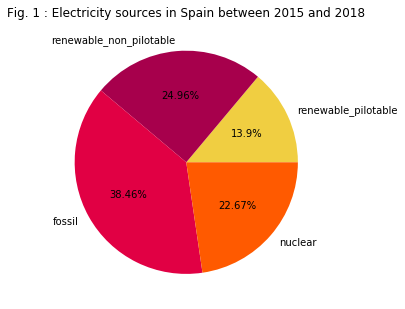

In [4]:
# Pie chart : showing the mean repartition between the different kinds of energy throughout the 4 years span.

renewable_pilotable = (energy.hydro_water_reservoir.mean() +
                       energy.hydro_run_of_river.mean() +
                       energy.biomass.mean() + energy.other_renewable.mean() + energy.waste.mean() -
                       energy.hydro_storage_consumption.mean())
renewable_non_pilotable = (energy.solar.mean() + energy.wind_onshore.mean())
fossil = energy.total_fossil.mean()
nuclear = energy.nuclear.mean()

plt.figure(figsize = (5,8))
plt.pie([renewable_pilotable, renewable_non_pilotable, fossil, nuclear], 
       labels = ['renewable_pilotable', 'renewable_non_pilotable', 'fossil', 'nuclear'], 
       autopct = lambda x : str(round(x,2))+'%',
       colors = ['#f0ce41','#a7004c','#e10044','#ff5a00'])
plt.title('Fig. 1 : Electricity sources in Spain between 2015 and 2018') ; 

**Analysis**

The electricity mix in Spain is dominated by fossil fuels.

The share of nuclear energy is identical to non-controllable renewable energies. This allows, among other things, to compensate for their intermittence.

The share of controllable renewable energy remains low at around 11%

                   df        sum_sq       mean_sq            F  PR(>F)
business_day      1.0  4.450159e+10  4.450159e+10  2264.399641     0.0
Residual      35070.0  6.892205e+11  1.965271e+07          NaN     NaN


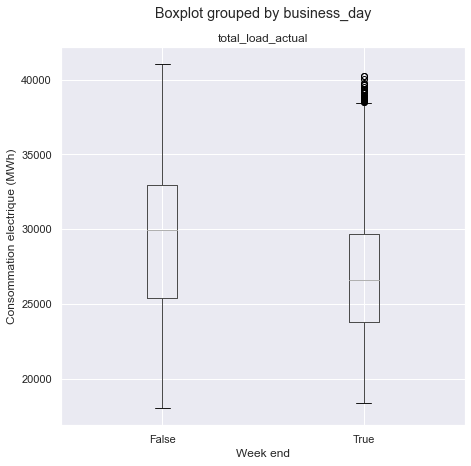

In [36]:
# Influence of business day on elecricity consumption. 

madrid["weekday"] = madrid.index.day_name() # column creation of day name

def ouvrable(jour) : 
    if jour in ['Saturday', 'Sunday'] : 
        return True
    else : return False

madrid['business_day'] = madrid['weekday'].apply(ouvrable) # column creation of business day

madrid.boxplot('total_load_actual', by = 'business_day', figsize = (7,7)) # Boxplot 
plt.xlabel('Week end')
plt.ylabel('Consommation electrique (MWh)');

#Statistical test showing the effect of business day on electricity consumption : 

result = statsmodels.formula.api.ols('total_load_actual ~ business_day', data = madrid).fit()
table = statsmodels.api.stats.anova_lm(result)

print(table)

**Analysis**

The ANOVA analysis shows that we can reject the hypothesis saying that business days do not influence the electricity consumption.

PR(>F) < 0.05

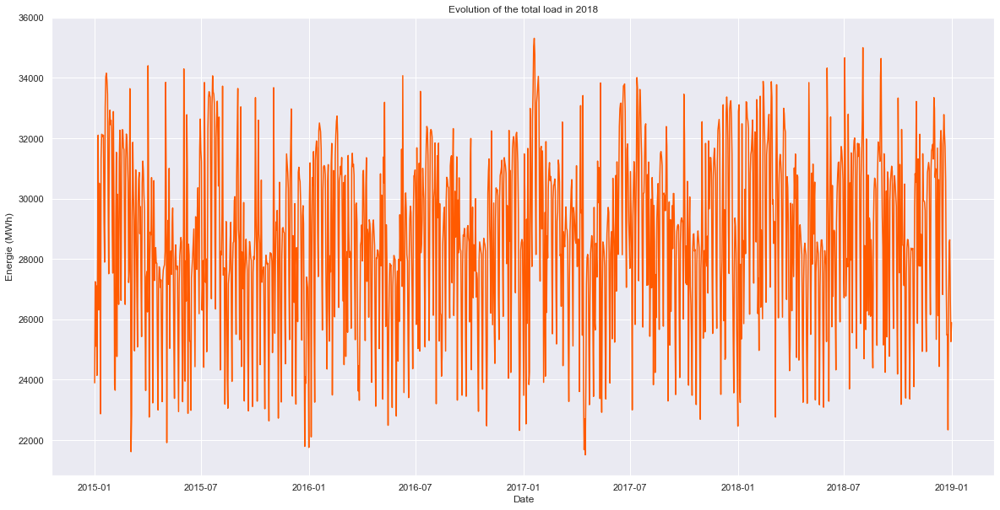

In [35]:
plt.figure(figsize= (20,10))
df = madrid['total_load_actual'].resample('D').mean()
plt.plot(df.index, df, color = '#ff5a00')
plt.xlabel('Date')
plt.ylabel('Energie (MWh)')
plt.title('Evolution of the total load in 2018'); 

**Analysis**

Spanish electricity consumption in 2018 is seasonal.

Indeed, we observe max values in winter (heaters, lights, ...) and summer (AC, pool,...).

However, there are significant inter-season fluctuations

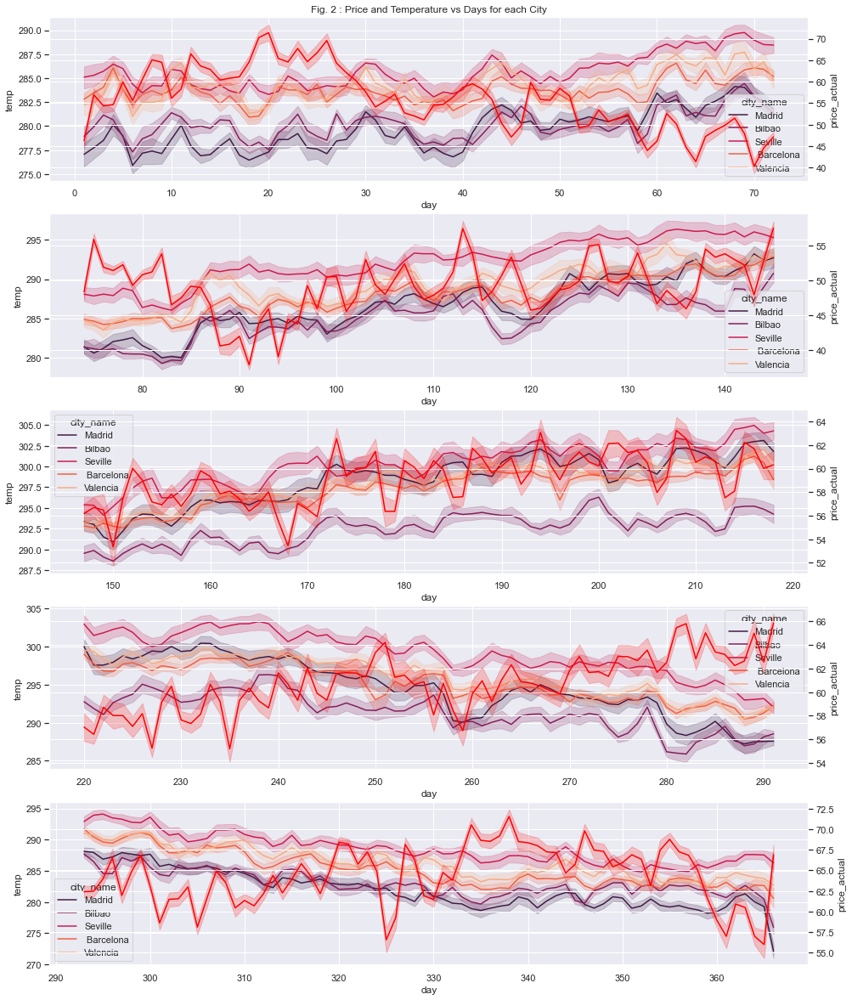

In [6]:
fig = plt.subplots(figsize=(16,20))

plt.subplot(511)
sns.lineplot(data=df_complet[df_complet.day < 73],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[df_complet.day < 73],
             x = 'day', y = 'price_actual', ax=ax2, color = 'red');

plt.subplots_adjust(top=0.9)
plt.title("Fig. 2 : Price and Temperature vs Days for each City")

plt.subplot(512)
sns.lineplot(data=df_complet[(df_complet.day > 73) & (df_complet.day < 146)],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[(df_complet.day > 73) & (df_complet.day < 146)],
             x = 'day', y = 'price_actual', ax=ax2, color = 'red');

plt.subplot(513)
sns.lineplot(data=df_complet[(df_complet.day > 146) & (df_complet.day < 219)],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[(df_complet.day > 146) & (df_complet.day < 219)],
             x = 'day', y = 'price_actual', ax=ax2, color = 'red');

plt.subplot(514)
sns.lineplot(data=df_complet[(df_complet.day > 219) & (df_complet.day < 292)],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[(df_complet.day > 219) & (df_complet.day < 292)],
             x = 'day', y = 'price_actual', ax=ax2, color = 'red');

plt.subplot(515)
sns.lineplot(data=df_complet[df_complet.day > 292],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[df_complet.day > 292],
             x = 'day', y = 'price_actual', ax=ax2, color = 'red');

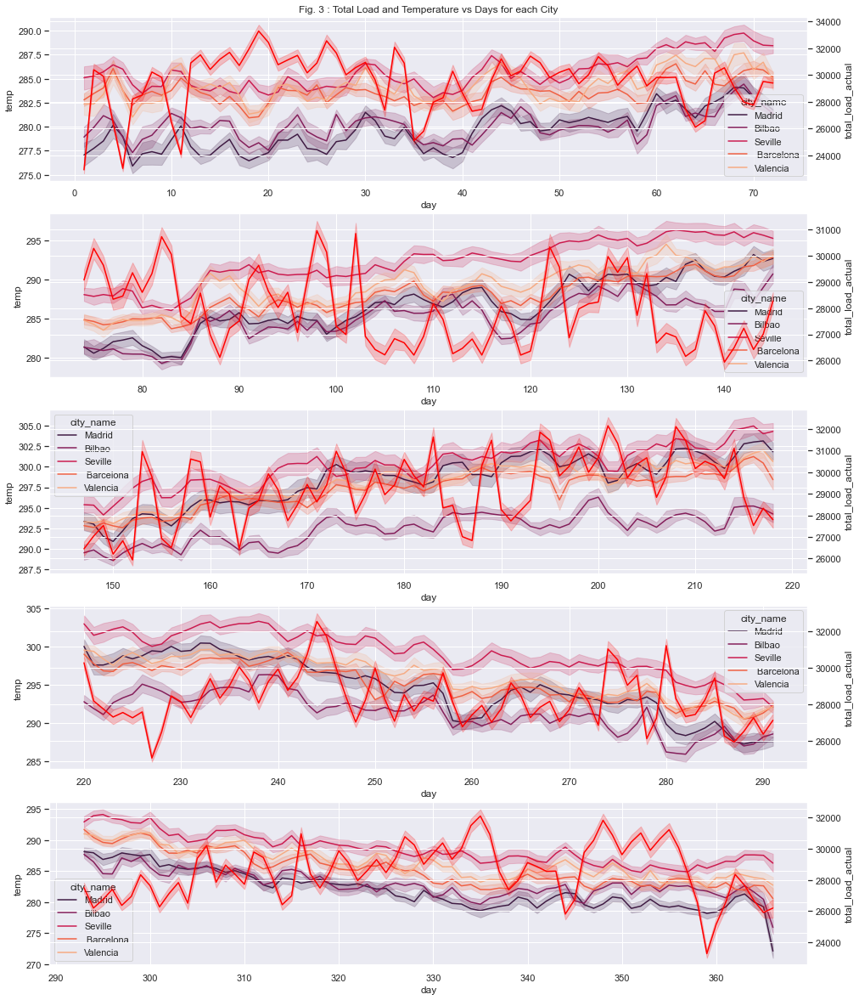

In [37]:
fig = plt.subplots(figsize=(16,20))

plt.subplot(511)
sns.lineplot(data=df_complet[df_complet.day < 73],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[df_complet.day < 73],
             x = 'day', y = 'total_load_actual', ax=ax2, color = 'red')

plt.subplots_adjust(top=0.9)
plt.title("Fig. 3 : Total Load and Temperature vs Days for each City")


plt.subplot(512)
sns.lineplot(data=df_complet[(df_complet.day > 73) & (df_complet.day < 146)],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[(df_complet.day > 73) & (df_complet.day < 146)],
             x = 'day', y = 'total_load_actual', ax=ax2, color = 'red')

plt.subplot(513)
sns.lineplot(data=df_complet[(df_complet.day > 146) & (df_complet.day < 219)],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[(df_complet.day > 146) & (df_complet.day < 219)],
             x = 'day', y = 'total_load_actual', ax=ax2, color = 'red')

plt.subplot(514)
sns.lineplot(data=df_complet[(df_complet.day > 219) & (df_complet.day < 292)],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[(df_complet.day > 219) & (df_complet.day < 292)],
             x = 'day', y = 'total_load_actual', ax=ax2, color = 'red')

plt.subplot(515)
sns.lineplot(data=df_complet[df_complet.day > 292],
            x = 'day', y='temp', hue = 'city_name', palette = 'rocket')
ax2 = plt.twinx()
sns.lineplot(data=df_complet[df_complet.day > 292],
             x = 'day', y = 'total_load_actual', ax=ax2, color = 'red');


**Analysis**

The idea behind Fig. 2 and Fig. 3, was to see if we can find a relation between the peaks of temperatures in each city (lows in winter, highs in summer) and the peaks of prices or power generation, which could have been an indicator of the influence of a city on the national metrics. From the results, however, it is hard to draw a conclusion.

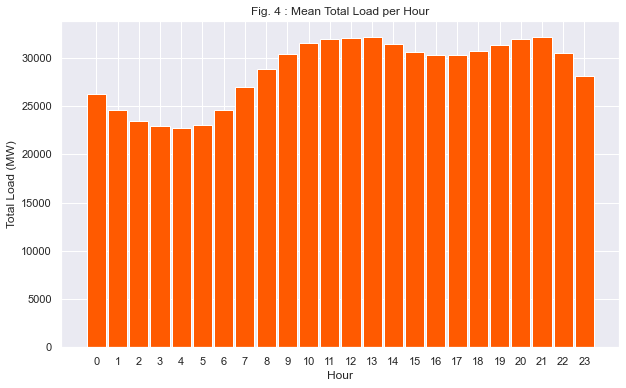

In [7]:
# Load par heure
tot_p_hour = [energy[energy.hour ==0].total_load_actual.mean(),
              energy[energy.hour ==1].total_load_actual.mean(),
              energy[energy.hour ==2].total_load_actual.mean(),
              energy[energy.hour ==3].total_load_actual.mean(),
              energy[energy.hour ==4].total_load_actual.mean(),
              energy[energy.hour ==5].total_load_actual.mean(),
              energy[energy.hour ==6].total_load_actual.mean(),
              energy[energy.hour ==7].total_load_actual.mean(),
              energy[energy.hour ==8].total_load_actual.mean(),
              energy[energy.hour ==9].total_load_actual.mean(),
              energy[energy.hour ==10].total_load_actual.mean(),
              energy[energy.hour ==11].total_load_actual.mean(),
              energy[energy.hour ==12].total_load_actual.mean(),
              energy[energy.hour ==13].total_load_actual.mean(),
              energy[energy.hour ==14].total_load_actual.mean(),
              energy[energy.hour ==15].total_load_actual.mean(),
              energy[energy.hour ==16].total_load_actual.mean(),
              energy[energy.hour ==17].total_load_actual.mean(),
              energy[energy.hour ==18].total_load_actual.mean(),
              energy[energy.hour ==19].total_load_actual.mean(),
              energy[energy.hour ==20].total_load_actual.mean(),
              energy[energy.hour ==21].total_load_actual.mean(),
              energy[energy.hour ==22].total_load_actual.mean(),
              energy[energy.hour ==23].total_load_actual.mean()]

fig = plt.figure(figsize=(10, 6))
hour = range(24)
plt.bar(range(24), tot_p_hour, color = '#ff5a00', width = 0.9, tick_label = hour)
plt.xlabel('Hour')
plt.ylabel('Total Load (MW)')
plt.title('Fig. 4 : Mean Total Load per Hour');

**Analysis**

Fig. 4 shows the mean total load per hour. As we could expect, it is higher in the morning, and in late afternoon, then decreases through the night. There is an obvious correlation between the time of the day and the power needed.

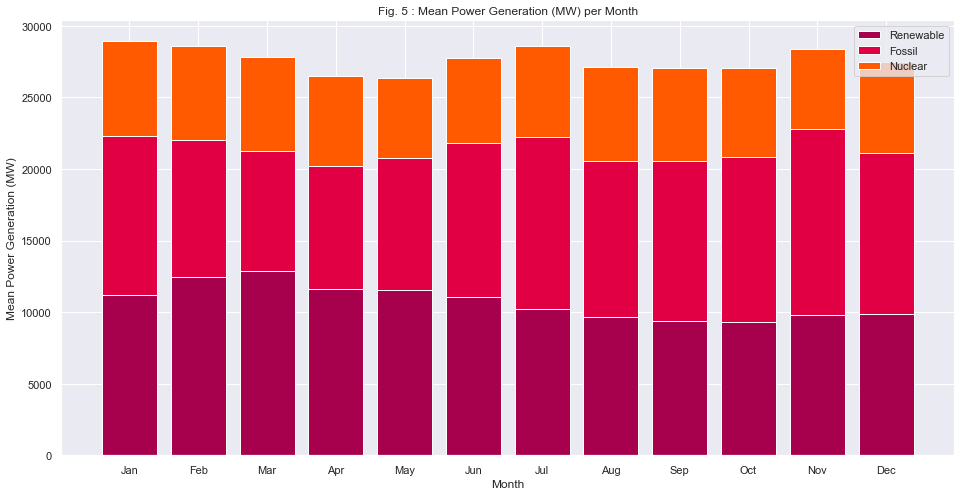

In [8]:
renewable_p_month = [energy[energy.month ==1].total_renewable.mean(),
                     energy[energy.month ==2].total_renewable.mean(),
                     energy[energy.month ==3].total_renewable.mean(),
                     energy[energy.month ==4].total_renewable.mean(),
                     energy[energy.month ==5].total_renewable.mean(),
                     energy[energy.month ==6].total_renewable.mean(),
                     energy[energy.month ==7].total_renewable.mean(),
                     energy[energy.month ==8].total_renewable.mean(),
                     energy[energy.month ==9].total_renewable.mean(),
                     energy[energy.month ==10].total_renewable.mean(),
                     energy[energy.month ==11].total_renewable.mean(),
                     energy[energy.month ==12].total_renewable.mean()]

fossil_p_month = [energy[energy.month ==1].total_fossil.mean(),
                  energy[energy.month ==2].total_fossil.mean(),
                  energy[energy.month ==3].total_fossil.mean(),
                  energy[energy.month ==4].total_fossil.mean(),
                  energy[energy.month ==5].total_fossil.mean(),
                  energy[energy.month ==6].total_fossil.mean(),
                  energy[energy.month ==7].total_fossil.mean(),
                  energy[energy.month ==8].total_fossil.mean(),
                  energy[energy.month ==9].total_fossil.mean(),
                  energy[energy.month ==10].total_fossil.mean(),
                  energy[energy.month ==11].total_fossil.mean(),
                  energy[energy.month ==12].total_fossil.mean()]
                                    
nuclear_p_month = [energy[energy.month ==1].nuclear.mean(),
                   energy[energy.month ==2].nuclear.mean(),
                   energy[energy.month ==3].nuclear.mean(),
                   energy[energy.month ==4].nuclear.mean(),
                   energy[energy.month ==5].nuclear.mean(),
                   energy[energy.month ==6].nuclear.mean(),
                   energy[energy.month ==7].nuclear.mean(),
                   energy[energy.month ==8].nuclear.mean(),
                   energy[energy.month ==9].nuclear.mean(),
                   energy[energy.month ==10].nuclear.mean(),
                   energy[energy.month ==11].nuclear.mean(),
                   energy[energy.month ==12].nuclear.mean()]

fig = plt.figure(figsize=(16, 8))
month = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.bar(range(12), renewable_p_month, color = '#a7004c', width = 0.8, label = 'Renewable', tick_label = month)
plt.bar(range(12), fossil_p_month, color = '#e10044', width = 0.8, label = 'Fossil',
        bottom = renewable_p_month)
plt.bar(range(12), nuclear_p_month, color = '#ff5a00', width = 0.8, label = 'Nuclear',
        bottom = (np.array(renewable_p_month) + np.array(fossil_p_month)))
plt.xlabel('Month')
plt.ylabel('Mean Power Generation (MW)')
plt.title('Fig. 5 : Mean Power Generation (MW) per Month')
plt.legend();

**Analysis**

Fig. 5 shows the repartition between the three types of energy thoughout the year (mean per month on the 4 years span).

First, we note that, as could be expected, the peaks in power generation are in winter (heaters, lights, ...) and in summer (air conditionning, pools, ...).

Nuclear energy seems pretty steady. Its impact on the forecast of prices and energy demand is probably minor.

However, there are important variations between fossil energies and renewable ones. We can imagine that, because of the lack of reliability of some sources of renewable energies (wind, solar), the generation cannot be steady ; thus, there is a need to compensate with the fossil sources.

The peak of Renewable energies power generation is in march. More wind in this month? We should find out...

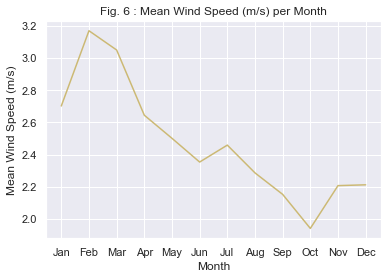

In [9]:
windspeed_p_month = [df_complet[df_complet.month ==1].wind_speed.mean(),
                   df_complet[df_complet.month ==2].wind_speed.mean(),
                   df_complet[df_complet.month ==3].wind_speed.mean(),
                   df_complet[df_complet.month ==4].wind_speed.mean(),
                   df_complet[df_complet.month ==5].wind_speed.mean(),
                   df_complet[df_complet.month ==6].wind_speed.mean(),
                   df_complet[df_complet.month ==7].wind_speed.mean(),
                   df_complet[df_complet.month ==8].wind_speed.mean(),
                   df_complet[df_complet.month ==9].wind_speed.mean(),
                   df_complet[df_complet.month ==10].wind_speed.mean(),
                   df_complet[df_complet.month ==11].wind_speed.mean(),
                   df_complet[df_complet.month ==12].wind_speed.mean()]

plt.plot(month, windspeed_p_month, c ='y')
plt.xlabel('Month')
plt.ylabel('Mean Wind Speed (m/s)')
plt.title('Fig. 6 : Mean Wind Speed (m/s) per Month');

In [10]:
print('The wind power generation represents',
      round(100*energy['wind_onshore'].mean()/
      (energy['wind_onshore'].mean()+energy['solar'].mean()),2),
     '% of the renewable sources that rely on the weather (wind and solar, mean throughout the 4 years span)')

The wind power generation represents 79.23 % of the renewable sources that rely on the weather (wind and solar, mean throughout the 4 years span)


**Analysis**

Fig. 6 confirms what we thought : the wind is at its peak in february and march, matching the peak of renewable energies generation seen in Fig. 5. Furthermore, 80% of power generation from renewable sources relying on the weather (solar and wind) is actually wind power generation, hence the dependance of the renewable energy generation to the wind speed.

NB : These are estimations based on the mean wind speed on the 5 cities. We assume it reflects the actual wind speed in the wind farms.

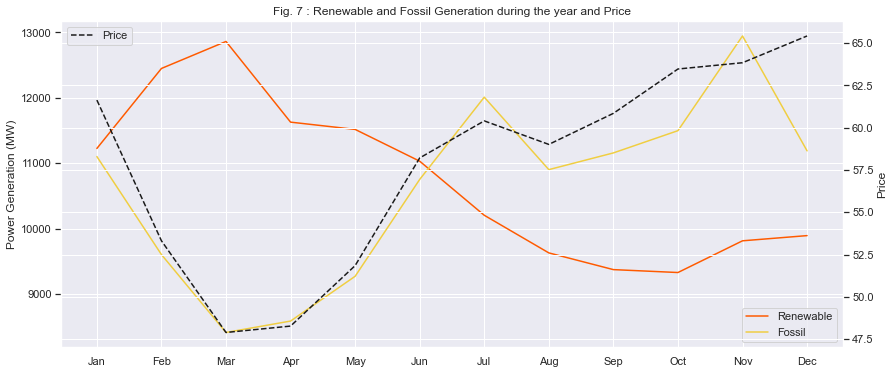

In [11]:
# Lien énergy % renouvelable et fossil sur prix.

price_mean_p_month = [energy[energy.month ==1]['price_actual'].mean(),
                      energy[energy.month ==2]['price_actual'].mean(),
                      energy[energy.month ==3]['price_actual'].mean(),
                      energy[energy.month ==4]['price_actual'].mean(),
                      energy[energy.month ==5]['price_actual'].mean(),
                      energy[energy.month ==6]['price_actual'].mean(),
                      energy[energy.month ==7]['price_actual'].mean(),
                      energy[energy.month ==8]['price_actual'].mean(),
                      energy[energy.month ==9]['price_actual'].mean(),
                      energy[energy.month ==10]['price_actual'].mean(),
                      energy[energy.month ==11]['price_actual'].mean(),
                      energy[energy.month ==12]['price_actual'].mean()]

fig, ax1 = plt.subplots(figsize=(14,6))
ax1.plot(month, renewable_p_month, color = '#ff5a00', label = 'Renewable')
ax1.plot(month, fossil_p_month, color = '#f0ce41', label = 'Fossil')
ax1.set_ylabel('Power Generation (MW)')
plt.legend(loc = 'lower right')
ax2 = plt.twinx()
ax2.plot(month, price_mean_p_month, 'k--', label = 'Price')
ax2.set_ylabel('Price')
plt.title('Fig. 7 : Renewable and Fossil Generation during the year and Price')
plt.legend();

**Analysis**

The correlation between the price and the type of power generation is pretty obvious in this lineplot.

Indeed, as the part of renewable energy is higher, the price is lower. Actually, the price reaches its low in march, matching the highest peak of power generation by renewable energies.

Conversely, the prices are higher where the Fossil generation rises.

From this graph, it seems obvious that there is a positive correlation between fossil generation and prices, and a negative correlation between renewable energies and prices.

# 3. Modelisation

## 3.1. Introduction

The gloabal aim is to predict the load and price for the next 24h, based on :
- Weather forecast (temperature, weather type, wind, cloud cover etc.)
- Hour, Weekday, month
- Energy mix

1. Load should be target #1 based on weather forecast, temporal analysis (hour, weekday, month)
2. Mix renewable/fossile target #2 based on load (target #1) and weather condition forecast
3. Price would be target #3, depending on the first 2 targets (load, mix energy, hence weather conditions, temporal analysis etc.)

We would like to get close to the predictions of TSO in the data (total_load_forecast).

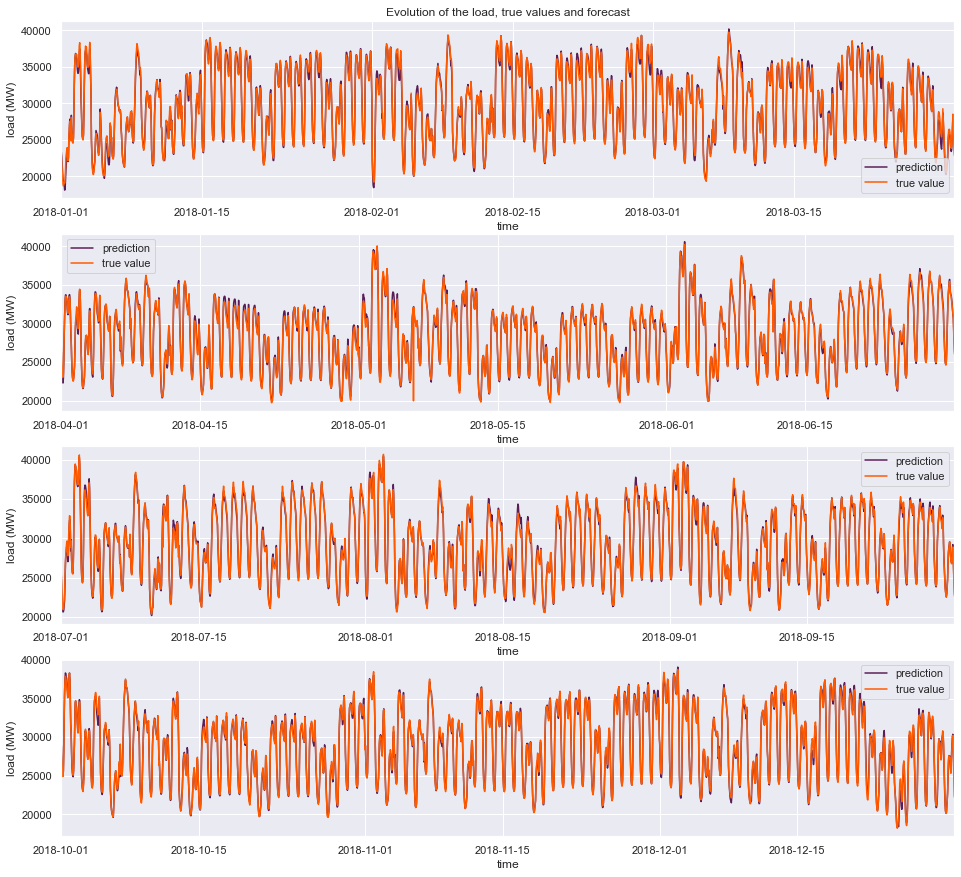

In [41]:
fig = plt.figure(figsize=(16,15))
plt.subplot(411)
plt.plot(energy['2018-01-01':'2018-03-31'].total_load_forecast, color = '#5a1d57', label = 'prediction')
plt.plot(energy['2018-01-01':'2018-03-31'].total_load_actual, '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.title('Evolution of the load, true values and forecast')
plt.xlim('2018-01-01','2018-03-31')
plt.legend()

plt.subplot(412)
plt.plot(energy['2018-04-01':'2018-06-30'].total_load_forecast, color = '#5a1d57', label = 'prediction')
plt.plot(energy['2018-04-01':'2018-06-30'].total_load_actual, '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-04-01','2018-06-30')
plt.legend()

plt.subplot(413)
plt.plot(energy['2018-07-01':'2018-09-30'].total_load_forecast, color = '#5a1d57', label = 'prediction')
plt.plot(energy['2018-07-01':'2018-09-30'].total_load_actual, '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-07-01','2018-09-30')
plt.legend()

plt.subplot(414)
plt.plot(energy['2018-10-01':'2018-12-31'].total_load_forecast, color = '#5a1d57', label = 'prediction')
plt.plot(energy['2018-10-01':'2018-12-31'].total_load_actual, '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-10-01','2018-12-31')
plt.legend();

In [28]:
y_true, y_pred = np.array(energy.total_load_actual), np.array(energy.total_load_forecast)
MAPE = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE)

Mean Absolute Prediction Error : 1.11%


The forecasted results are already very good. We are going to try to get close to that.

## 3.2. Linear models

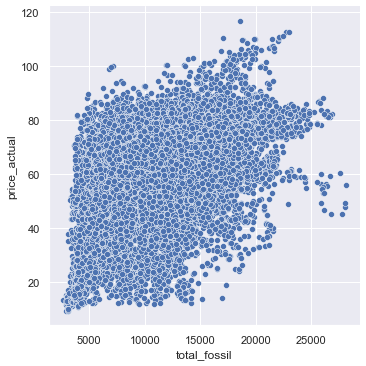

In [77]:
g = sns.relplot(data=energy, x="total_fossil", y="price_actual", kind = 'scatter',
                height = 5)

We can imagine a linear model between the price and the different kind of energies.

Temporal series model.

Trying to find a relation between the price and the load :

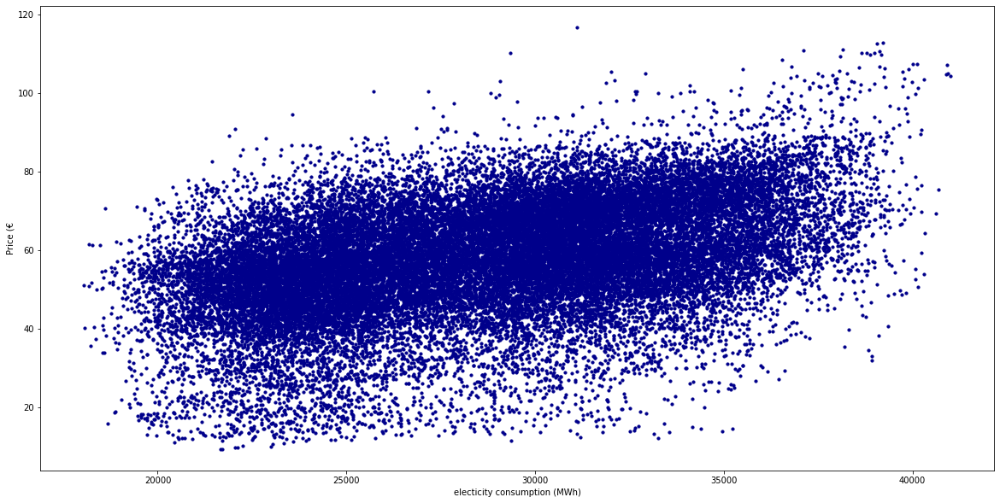

In [18]:
plt.figure(figsize = (20,10))
plt.scatter(energy['total_load_actual'], energy['price_actual'], s = 10, color = 'darkblue')
plt.xlabel('electicity consumption (MWh)')
plt.ylabel('Price (€'); 

In [654]:
feature_price = energy[['total_load_actual']]
target_price = energy['price_actual']

In [655]:
model = LinearRegression()
model.fit(feature_price, target_price)
print('score R2', model.score(feature_price, target_price)) # R2 assez faible compte tenu de la forte dispersion des points 

score R2 0.18982081661031602


## Linear analysis : price vs load

In [656]:
print(f_regression(feature_price, target_price)) ## Relation très significative entre le prix et la consommation electrique 


(array([8214.84630615]), array([0.]))


In [657]:
pente = model.coef_
ordonnée = model.intercept_
print('equation du modele lineaire :', pente[0], 'x','+', ordonnée)

equation du modele lineaire : 0.0013536639554986728 x + 19.035649545766006


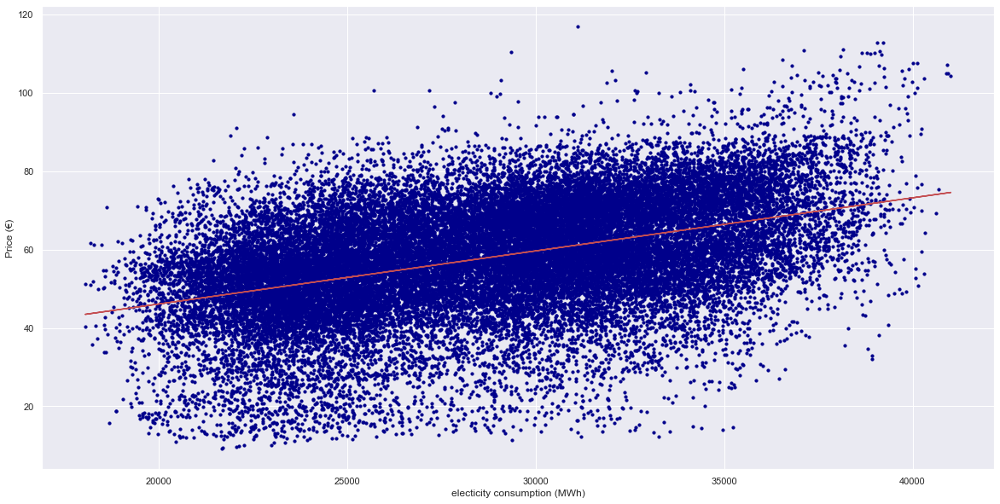

In [658]:
plt.figure(figsize = (20,10))
plt.scatter(energy['total_load_actual'], energy['price_actual'], s = 10, color = 'darkblue')
plt.plot(energy['total_load_actual'], pente*np.array(energy['total_load_actual'])+ ordonnée, color = 'r')
plt.xlabel('electicity consumption (MWh)')
plt.ylabel('Price (€)'); 

MAPE Comparison.

In [29]:
erreur_model_lineaire =  mean_squared_error(energy['price_actual'], pente*np.array(energy['total_load_actual'])+ ordonnée)
print(erreur_model_lineaire)

163.4818022129007


In [30]:
erreur_prediction = mean_squared_error(energy['price_actual'], energy['price_day_ahead'])
print(erreur_prediction) # Notre modele de regression lineaire à partir de la consommation electrique engendre moins d'erreur
# que les prédiction présentes dans la base de données

175.55870664499204


## 3.3. Time series

## 3.3.1. Load prediction
### 3.3.3.1. SARIMAX model

We now want to test temporal models. First, we are going to select the features with most influence. The type of energy is of no incidence on the load. Only the temporal parameters (hour, day, month) and the weather conditions should influence the load.

In [399]:
load_energy = energy.drop(['biomass','fossil_brown_coal','fossil_hard_coal',
                          'fossil_oil','hydro_storage_consumption','hydro_run_of_river',
                          'hydro_water_reservoir','other','other_renewable','waste', 'fossil_gas',
                          'nuclear', 'solar', 'wind_onshore', 'forecast_solar_day_ahead',
                          'forecast_wind_onshore_day_ahead','total_load_forecast',
                          'price_day_ahead','hour_a', 'total_renewable','total_fossil',
                          'clouds_all_sol', 'price_actual'],
                          axis = 1)

load_energy.corr(method = 'spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('inferno'))

,total_load_actual,month,day,hour,temp_mean,pressure,humidity,wind_speed,clouds_all_pop
total_load_actual,1.0,-0.037,-0.2,0.55,0.18,-0.01,-0.34,0.17,0.022
month,-0.037,1.0,0.0033,0.0,0.23,0.23,0.0045,-0.21,-0.11
day,-0.2,0.0033,1.0,0.0,-0.00072,-0.0075,0.0096,0.0086,0.022
hour,0.55,0.0,0.0,1.0,0.27,-0.04,-0.44,0.28,0.012
temp_mean,0.18,0.23,-0.00072,0.27,1.0,-0.11,-0.71,0.13,-0.21
pressure,-0.01,0.23,-0.0075,-0.04,-0.11,1.0,-0.014,-0.29,-0.34
humidity,-0.34,0.0045,0.0096,-0.44,-0.71,-0.014,1.0,-0.31,0.32
wind_speed,0.17,-0.21,0.0086,0.28,0.13,-0.29,-0.31,1.0,0.3
clouds_all_pop,0.022,-0.11,0.022,0.012,-0.21,-0.34,0.32,0.3,1.0


The weekay, hour, price and humidity seem to have the most influence on the load. However, we can argue that the price is a consequence of the load, not the other way around. Furthermore, we do not know if the humidity feature is absolute, or relative (ie. dependant of the temperature), hence we are not sure if it is a reliable feature.

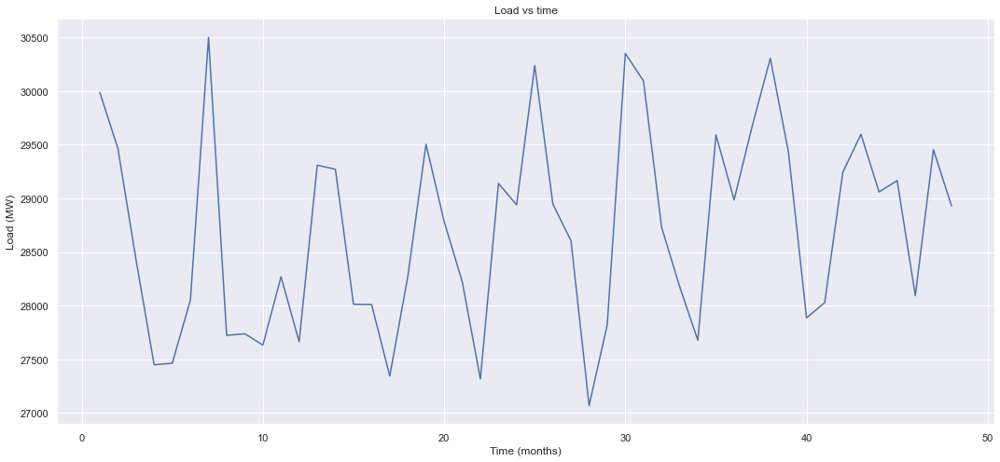

In [570]:
# We first want to see the load vs time, per month
load_t = pd.DataFrame(energy.total_load_actual)

# ce serait plus simple dans un premier temps de regarder par mois et non par heure
# on va transfo la série, faire les moyennes par mois du prix, avec un groupby

load_t_g = load_t.groupby([load_t.index.year, load_t.index.month])['total_load_actual'].agg(['mean'])
load_t_g = pd.DataFrame(load_t_g)
plt.figure(figsize = (18,8))
plt.plot(np.arange(1,49), load_t_g['mean'])
plt.title('Load vs time')
plt.xlabel('Time (months)')
plt.ylabel('Load (MW)');

There is a yearly period, although the pattern is not exactly the same through the years.

Now to check the decomposition of the load, if we look only at a fixed hour every day.

<Figure size 432x288 with 0 Axes>

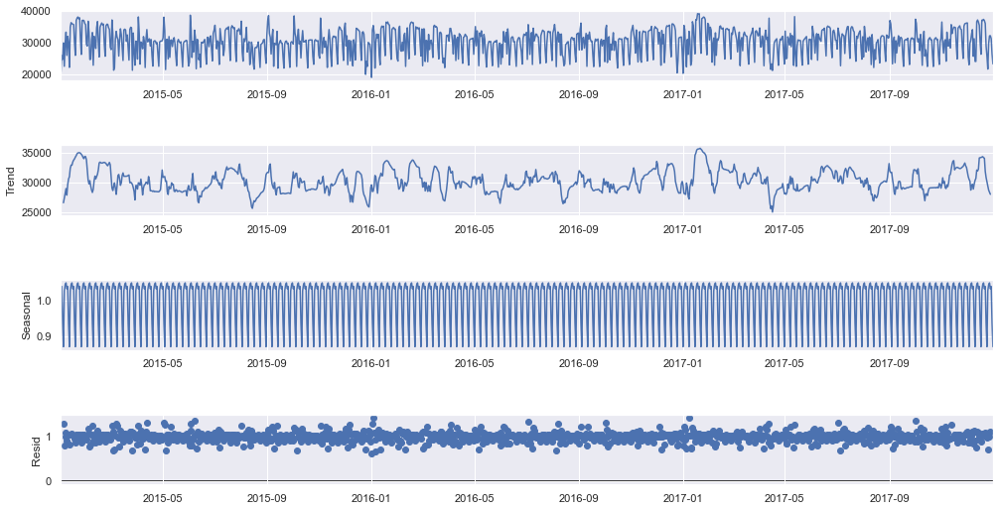

In [94]:
load_9 = pd.DataFrame(energy[energy.hour == 9].total_load_actual)
load_9_train = load_9['2015-01':'2017-12-31']
load_9_dec = seasonal_decompose(load_9_train, model = 'multipicative')

fig = plt.figure()  
fig = load_9_dec.plot()  
fig.set_size_inches(16, 8);

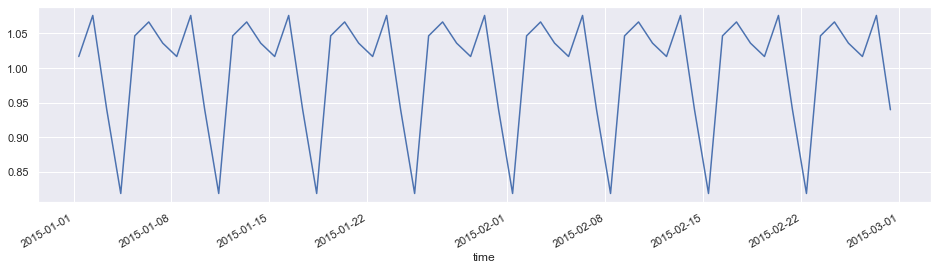

In [42]:
# Hard to tell the period for those graphs. We are going, just to get the period,
# to select a smaller sample
load_test = load_9['2015-01':'2015-02-28']
load_testdec = seasonal_decompose(load_test, model = 'multipicative')

plt.figure(figsize= (16,4))
load_testdec.seasonal.plot();

We can see now that the period is 7 days, which make sense.

### Preprocessing the datas and creating the model

We know from previous tests, that exog parameters help the model in precision. We are going to improve the quality and quantity of those exog parameters, and try to predict 24h (as opposed to a fixed hour in previous tests) from the 3 first years.

In [572]:
# Creation of exog parameters
exog_data = load_energy.drop(['total_load_actual'], axis = 1)

# transform exog_data :

# Convert categorical variables
exog_data = pd.get_dummies(exog_data, columns = ['month','day'])

# Scaled the others
scaler = MinMaxScaler()

exog_data[['temp_mean','pressure','humidity','wind_speed','clouds_all_pop']] = scaler.fit_transform(
    exog_data[['temp_mean','pressure','humidity','wind_speed','clouds_all_pop']])

In [573]:
# Target selection
target_load = pd.DataFrame(load_energy.total_load_actual)

In [574]:
# Transform target to have multiple target (for each hour)

def transform_to_hour_cols(series):
    df = pd.DataFrame()

    start = series.index.min()
    end = series.index.max()
    
    df['year'] = series.index.year
    df['month'] = series.index.month
    df['day'] = series.index.day
    df['hours'] = series.index.hour
    df['loads'] = series.values
    
    df = df.set_index(['year', 'month', 'day', 'hours'], append=True).unstack()
    df = df.groupby(['year', 'month', 'day']).sum()
    
    df.reset_index(inplace=True)
    df.drop(['year', 'month', 'day'], axis=1, inplace=True)
    
    date_list = pd.date_range(start=start, end=end, freq='D').strftime('%Y-%m-%d')
    
    df.index = pd.DatetimeIndex(date_list, name='date')
    
    return df

target_load2 = transform_to_hour_cols(target_load['total_load_actual'])
target_load2.head()

D:\Anaconda\lib\site-packages\pandas\core\generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


loads                                                        \
hours            0        1        2        3        4        5        6    
date                                                                        
2015-01-01  25385.0  24382.0  22734.0  21286.0  20264.0  19905.0  20010.0   
2015-01-02  27070.0  24935.0  23214.0  22540.0  22096.0  22066.0  22275.0   
2015-01-03  25564.0  23584.0  22194.0  21296.0  21145.0  21316.0  21674.0   
2015-01-04  25254.0  23620.0  22606.0  22191.0  21929.0  22195.0  24035.0   
2015-01-05  25069.0  23390.0  21988.0  21182.0  20778.0  20309.0  20252.0   

                                                                           \
hours            7        8        9        10       11       12       13   
date                                                                        
2015-01-01  20377.0  20094.0  20637.0  22250.0  23547.0  24133.0  24713.0   
2015-01-02  23025.0  23699.0  25834.0  27927.0  29072.0  29071.0  29439.0   
2015-01-03  22127.0  22756.0  24654.0  26454.0  26959.0  26716.0  26802.0   
2015-01-04  26807.0  28316.0  29871.0  30585.0  30772.0  30685.0  30429.0   
2015-01-05  19964.0  20796.0  22478.0  23834.0  24429.0  28901.0  28901.0   

                                                                           \
hours            14       15       16       17       18       19       20   
date                                                                        
2015-01-01  24672.0  23528.0  23118.0  23606.0  26447.0  28020.0  29014.0   
2015-01-02  29241.0  27973.0  27320.0  27157.0  29045.0  31967.0  33266.0   
2015-01-03  26416.0  25362.0  24770.0  24501.0  24992.0  27964.0  29694.0   
2015-01-04  28741.0  28249.0  28105.0  27908.0  27577.0  27418.0  28604.0   
2015-01-05  28901.0  28901.0  28901.0  28901.0  21888.0  22048.0  22858.0   

                                       
hours            21       22       23  
date                                   
2015-01-01  29571.0  29031.0  26798.0  
2015-01-02  33668.0  32426.0  29705.0  
2015-01-03  29874.0  28979.0  26863.0  
2015-01-04  30346.0  28190.0  26270.0  
2015-01-05  25604.0  25381.0  23822.0

In [575]:
# Checking the stationnarity as is for each hour
for i in np.arange(0,24):
    print('the p_value is',sm.tsa.stattools.adfuller(target_load2.loads[i])[1], 'for hour',i)

the p_value is 1.5212245248954226e-05 for hour 0
the p_value is 1.3354726925455148e-05 for hour 1
the p_value is 3.62661704593235e-06 for hour 2
the p_value is 6.981991541948654e-08 for hour 3
the p_value is 5.686126219262142e-08 for hour 4
the p_value is 1.6061494059253342e-08 for hour 5
the p_value is 2.0060465890911383e-10 for hour 6
the p_value is 2.0794492573629233e-10 for hour 7
the p_value is 5.910972483769361e-11 for hour 8
the p_value is 3.934768178708805e-10 for hour 9
the p_value is 4.014797416928092e-09 for hour 10
the p_value is 3.8039992057040475e-09 for hour 11
the p_value is 4.890708556910079e-09 for hour 12
the p_value is 1.0731233873313968e-08 for hour 13
the p_value is 7.203267313467285e-08 for hour 14
the p_value is 2.1246636299703127e-07 for hour 15
the p_value is 1.6498710281031785e-07 for hour 16
the p_value is 1.3684773026273377e-07 for hour 17
the p_value is 1.156796397560888e-07 for hour 18
the p_value is 5.782363079437559e-07 for hour 19
the p_value is 6.6365

In [576]:
# Regarding this, we can set
d = D = 0

Plot ACF and PACF for each hour.

[]

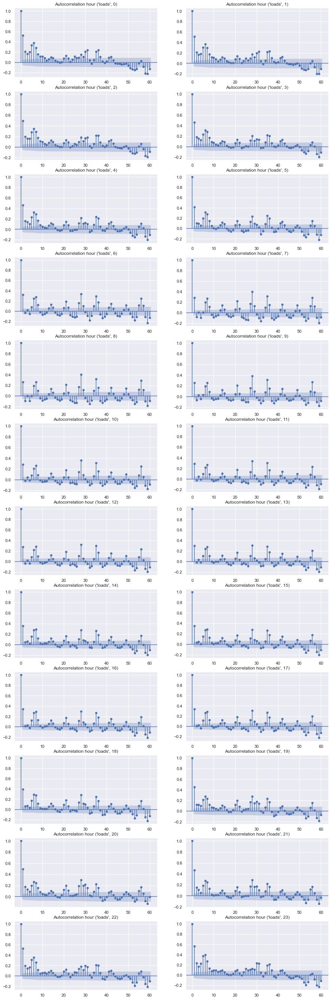

In [583]:
plots = len(target_load2.columns)
fig, axs = plt.subplots(int(plots/2), 2, figsize=(15, 2*plots))

for hour, ax in zip(target_load2.columns, axs.flatten()):
        plot_acf(target_load2.loc[:,hour], ax=ax, lags=60)
        ax.set_title('Autocorrelation hour ' + str(hour))
plt.plot()

[]

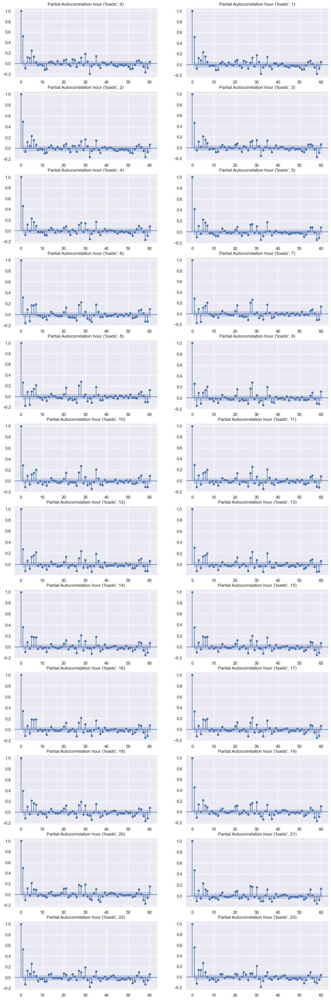

In [584]:
plots = len(target_load2.columns)
fig, axs = plt.subplots(int(plots/2), 2, figsize=(15, 2*plots))

for hour, ax in zip(target_load2.columns, axs.flatten()):
        plot_pacf(target_load2.loc[:,hour], ax=ax, lags=60)
        ax.set_title('Partial Autocorrelation hour ' + str(hour))
plt.plot()

In [585]:
# Parameters q, p, Q, P
P = 1
Q = 1
p = 1
q = 1

In [586]:
liste_sarimax = []

for i in np.arange(0,24):
    sarimax = sm.tsa.SARIMAX(target_load[target_load.index.hour == i]['2015-01-01':'2017-12-31'],
                              exog = exog_data[exog_data.hour == i]['2015-01-01':'2017-12-31'],
                                order = (p,d,q), seasonal_order = (P,D,Q,7), trend = 'n')
    sarimax_fit = sarimax.fit(max_iter = 200, method = 'bfgs')
    liste_sarimax.append(sarimax_fit)

#sarimax_0_fit.summary()

D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.702718
         Iterations: 44
         Function evaluations: 47
         Gradient evaluations: 47


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


         Current function value: 8.601920
         Iterations: 50
         Function evaluations: 54
         Gradient evaluations: 54


D:\Anaconda\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.555954
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


         Current function value: 8.572948
         Iterations: 50
         Function evaluations: 63
         Gradient evaluations: 63


D:\Anaconda\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.545426
         Iterations: 31
         Function evaluations: 35
         Gradient evaluations: 35


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.622961
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.923656
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.370771
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.544136
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.516006
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.434840
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.382866
         Iterations: 16
         Function evaluations: 20
         Gradient evaluations: 20


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.384288
         Iterations: 20
         Function evaluations: 24
         Gradient evaluations: 24


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.371332
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.307079
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.365882
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.415194
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.438467
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.430528
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.416597
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.305716
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 9.118075
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.930502
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30


D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
D:\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 8.779475
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47


In [627]:
load_pred = []

for i in np.arange(0,24):
    load_pred.append(liste_sarimax[i].predict(start = '2018-01-01',
                                              end = '2018-12-31',
                                              exog = exog_data[exog_data.hour == i]
                                              ['2018-01-01 00:00:00':'2018-12-31 23:00:00']))

In [628]:
for i in np.arange(0,24):
    load_pred[i] = pd.DataFrame(load_pred[i]) # conversion to dataframe

In [629]:
# Now time to concatenate all the df, and order them by time
load_pred = pd.concat(load_pred[i] for i in np.arange(0,24))
load_pred = load_pred.sort_index()

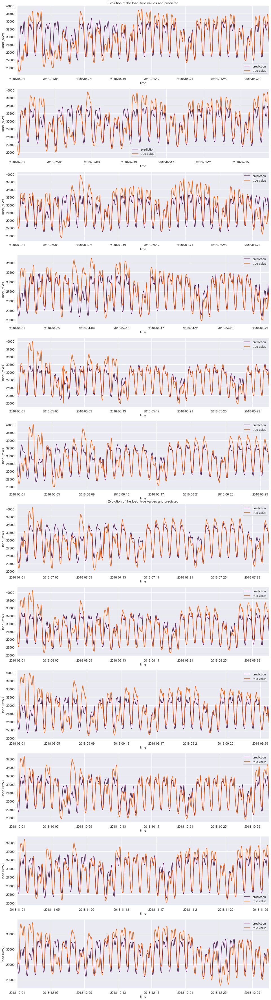

In [632]:
# TIme to visualize the results

load_test = target_load['2018-01-01':'2018-12-31']

fig = plt.figure(figsize=(16,64))
plt.subplot(12,1,1)
plt.plot(load_pred['2018-01-01':'2018-01-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-01-01':'2018-01-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.title('Evolution of the load, true values and predicted')
plt.xlim('2018-01-01','2018-01-31')
plt.legend()

plt.subplot(12,1,2)
plt.plot(load_pred['2018-02-01':'2018-02-28'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-02-01':'2018-02-28'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-02-01','2018-02-28')
plt.legend()

plt.subplot(12,1,3)
plt.plot(load_pred['2018-03-01':'2018-03-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-03-01':'2018-03-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-03-01','2018-03-31')
plt.legend()

plt.subplot(12,1,4)
plt.plot(load_pred['2018-04-01':'2018-04-30'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-04-01':'2018-04-30'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-04-01','2018-04-30')
plt.legend()

plt.subplot(12,1,5)
plt.plot(load_pred['2018-05-01':'2018-05-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-05-01':'2018-05-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-05-01','2018-05-31')
plt.legend()

plt.subplot(12,1,6)
plt.plot(load_pred['2018-06-01':'2018-06-30'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-06-01':'2018-06-30'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-06-01','2018-06-30')
plt.legend()

plt.subplot(12,1,7)
plt.plot(load_pred['2018-07-01':'2018-07-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-07-01':'2018-07-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.title('Evolution of the load, true values and predicted')
plt.xlim('2018-07-01','2018-07-31')
plt.legend()

plt.subplot(12,1,8)
plt.plot(load_pred['2018-08-01':'2018-08-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-08-01':'2018-08-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-08-01','2018-08-31')
plt.legend()

plt.subplot(12,1,9)
plt.plot(load_pred['2018-09-01':'2018-09-30'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-09-01':'2018-09-30'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-09-01','2018-09-30')
plt.legend()

plt.subplot(12,1,10)
plt.plot(load_pred['2018-10-01':'2018-10-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-10-01':'2018-10-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-10-01','2018-10-31')
plt.legend()

plt.subplot(12,1,11)
plt.plot(load_pred['2018-11-01':'2018-11-30'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-11-01':'2018-11-30'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-11-01','2018-11-30')
plt.legend()

plt.subplot(12,1,12)
plt.plot(load_pred['2018-12-01':'2018-12-31'], color = '#5a1d57', label = 'prediction')
plt.plot(load_test['2018-12-01':'2018-12-31'], '#ff5a00', label = 'true value')
plt.xlabel('time')
plt.ylabel('load (MW)')
plt.xlim('2018-12-01','2018-12-31')
plt.legend();

In [633]:
y_true, y_pred = np.array(load_test), np.array(load_pred)
MAPE = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE)

Mean Absolute Prediction Error : 6.79%


**Piste d'amélioration : prendre en compte les jours fériés!**

However, we only have three years to train our model, meaning only 3 datas lignes for each holidays to train the model, which is quite few. We can imagine the results would not be that much better.

**Different set of parameters for each hour? (p,d,q)(P,D,Q)**

### Questions regarding those temporal models :

- Possible to quantify the influence of the temperature on those models?

### Positive point for upcoming models
- With exog parameters, it seems we capture more variance
- working with a set hour (9am in iteration 3), allows faster models, and do not need to take into acount the 24h period : might be more efficient with more advanced models. Furhermore, some hours are more likely to be influenced by the weekday (night hours in the weekend for exemple) than others.
- Add exog parameters?

### Other conclusions / ideas
- SARIMAX model seems unable to capture all the information in our dataset (prob(JB) always = 0)
- For price prediction : might take as exog parameter the % of wind and solar energy in the mix, scaled

**LIMITES : Ce modèle prend des exog parameters que l'on ne connaît pas a priori en avance : cela serait à corriger pour être en mesure de véritablement comparer avec les résultats des réseaux de neurones.**

## 3.3.2. Load Prediction : Deep Learning

### 3.3.2.1 Univariate CNN hour by hour

In [3]:
df_load = energy[['total_load_actual']]
df_load.head()

,total_load_actual
time,
2015-01-01 00:00:00,25385.0
2015-01-01 01:00:00,24382.0
2015-01-01 02:00:00,22734.0
2015-01-01 03:00:00,21286.0
2015-01-01 04:00:00,20264.0


In [4]:
# separation train / test

df_load_train = df_load[:'2017-12-31']
df_load_test = df_load['2018-01-01':]

scaler_load = preprocessing.StandardScaler()
df_load_train_scaled = scaler_load.fit_transform(df_load_train)
df_load_test_scaled = scaler_load.transform(df_load_test)

In [5]:
# Creation of a function, that from a dataset, is going to create :
# a target dataset (total_load) and a features dataset made of the target
# dataset at the n_timesteps previous steps

def create_dataset(dataset, n_timesteps):
    dataX, dataY = [], []
    for i in range(len(dataset) - n_timesteps - 1):
        x = dataset[i:i+n_timesteps, 0] # Total_load between t-n and t-1
        y = dataset[i + n_timesteps, 0] # Totalload at t
        dataX.append(x)
        dataY.append(y)
    return np.array(dataX), np.array(dataY)

X_train_load_ucnn, y_train_load_ucnn = create_dataset(df_load_train_scaled, 168) # 168 steps = a week
X_test_load_ucnn, y_test_load_ucnn = create_dataset(df_load_test_scaled, 168)

X_train_load_ucnn = np.expand_dims(X_train_load_ucnn, 2) # to indicate that each 'individual' as only one feature
X_test_load_ucnn = np.expand_dims(X_test_load_ucnn, 2)

In [6]:
# creation of the model

ucnn_load_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(16, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(32, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1)
])

ucnn_load_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
ucnn_load_model.fit(X_train_load_ucnn, y_train_load_ucnn, epochs = 40, validation_split = .15, batch_size = 32, verbose = 1)

Epoch 1/40
695/695 [==============================] - 3s 4ms/step - loss: 0.1275 - val_loss: 0.0359
Epoch 2/40
695/695 [==============================] - 3s 4ms/step - loss: 0.0375 - val_loss: 0.0276
Epoch 3/40
695/695 [==============================] - 2s 4ms/step - loss: 0.0283 - val_loss: 0.0223
Epoch 4/40
695/695 [==============================] - 2s 4ms/step - loss: 0.0243 - val_loss: 0.0190
Epoch 5/40
695/695 [==============================] - 2s 4ms/step - loss: 0.0224 - val_loss: 0.0202
Epoch 6/40
695/695 [==============================] - 3s 4ms/step - loss: 0.0207 - val_loss: 0.0154
Epoch 7/40
695/695 [==============================] - 2s 4ms/step - loss: 0.0194 - val_loss: 0.0150
Epoch 8/40
695/695 [==============================] - 2s 3ms/step - loss: 0.0186 - val_loss: 0.0153
Epoch 9/40
695/695 [==============================] - 2s 4ms/step - loss: 0.0177 - val_loss: 0.0138
Epoch 10/40
695/695 [==============================] - 2s 4ms/step - loss: 0.0171 - val_loss: 0.0129

In [8]:
# unscaling
y_test_load_ucnn_unscaled = np.sqrt(scaler_load.var_[0])*y_test_load_ucnn + scaler_load.mean_[0]

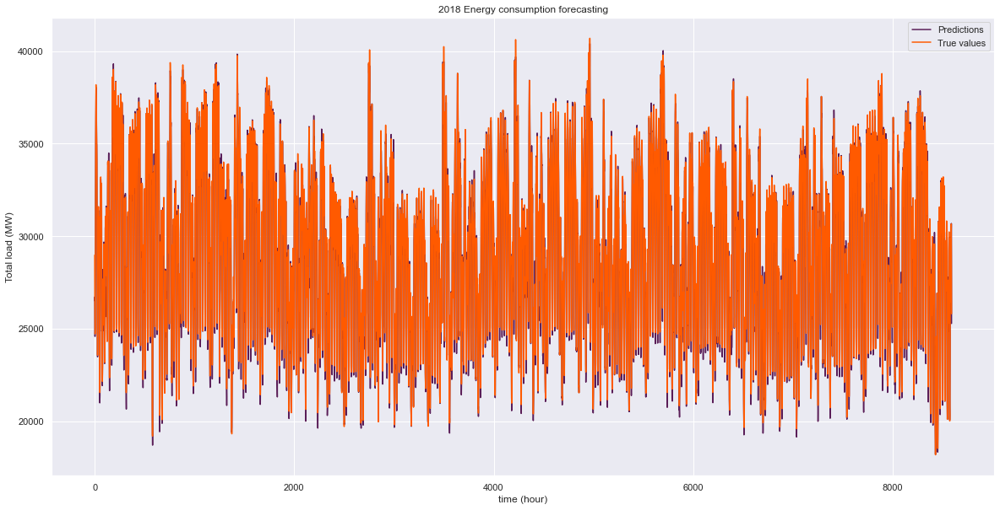

MSE :  269697.54
Mean Absolute Prediction Error : 18.85%


In [9]:
prediction_ucnn_load = ucnn_load_model.predict(X_test_load_ucnn)
prediction_ucnn_load = np.sqrt(scaler_load.var_[0])*prediction_ucnn_load + scaler_load.mean_[0]
y_test_load_ucnn_unscaled = np.sqrt(scaler_load.var_[0])*y_test_load_ucnn + scaler_load.mean_[0]

MSE :  245718.32
Mean Absolute Prediction Error : 18.85%


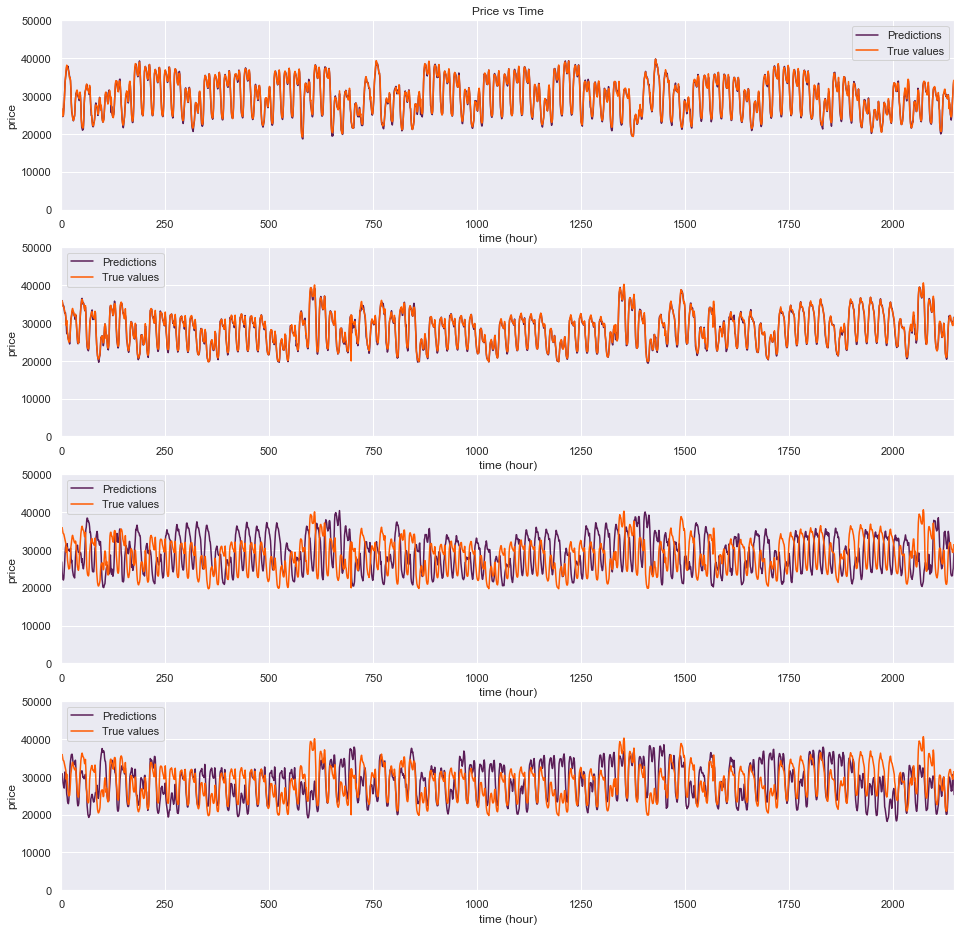

In [15]:
fig = plt.figure(figsize = (16,16))
plt.subplot(411)
plt.plot(prediction_ucnn_load[0: len(prediction_ucnn_load)//4], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[0: len(prediction_ucnn_load)//4], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()

plt.subplot(412)
plt.plot(prediction_ucnn_load[len(prediction_ucnn_load)//4: len(prediction_ucnn_load)//2], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[len(prediction_ucnn_load)//4: len(prediction_ucnn_load)//2], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.legend()

plt.subplot(413)
plt.plot(prediction_ucnn_load[len(prediction_ucnn_load)//2: 3*len(prediction_ucnn_load)//4], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[len(prediction_ucnn_load)//4: len(prediction_ucnn_load)//2], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.legend()

plt.subplot(414)
plt.plot(prediction_ucnn_load[3*len(prediction_ucnn_load)//4: len(prediction_ucnn_load)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[len(prediction_ucnn_load)//4: len(prediction_ucnn_load)//2], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.legend()

print("MSE : ", round(mean_squared_error(y_test_load_ucnn_unscaled, prediction_ucnn_load),2))

num = y_test_load_ucnn_unscaled - prediction_ucnn_load
MAPE_1 = np.mean(np.abs(num / y_test_load_ucnn_unscaled[:])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

### 3.3.2.2 Univariate CNN 24 hours by 24 hours

In [16]:
def predict_24h_uni(X_test, model):
    '''
    This function is to create prediction based on X_test.
    It will predict the next 24 hours each 24 hour based on the last n_time_steps values.
    It is made for univariate models.
    '''
    pred = []
    for hour in range(0, len(X_test)-24, 24):
        sample = np.reshape(X_test[hour], (1, X_test[0].shape[0], X_test[0].shape[1]))
        for i in range(24):
            next_step = model.predict(sample)
            next_step = np.reshape(next_step, (1,1,1))
            sample = np.concatenate([sample[:,1:,:], next_step], axis = 1)
            pred.append(next_step[0,0,0])
    return pred

In [17]:
prediction_ucnn_load_24 = predict_24h_uni(X_test_load_ucnn, ucnn_load_model)

In [18]:
prediction_ucnn_load_24 = np.sqrt(scaler_load.var_[0])*np.array(prediction_ucnn_load_24) + scaler_load.mean_[0]

MSE :  27291211.253757834
Mean Absolute Prediction Error : 12.96%


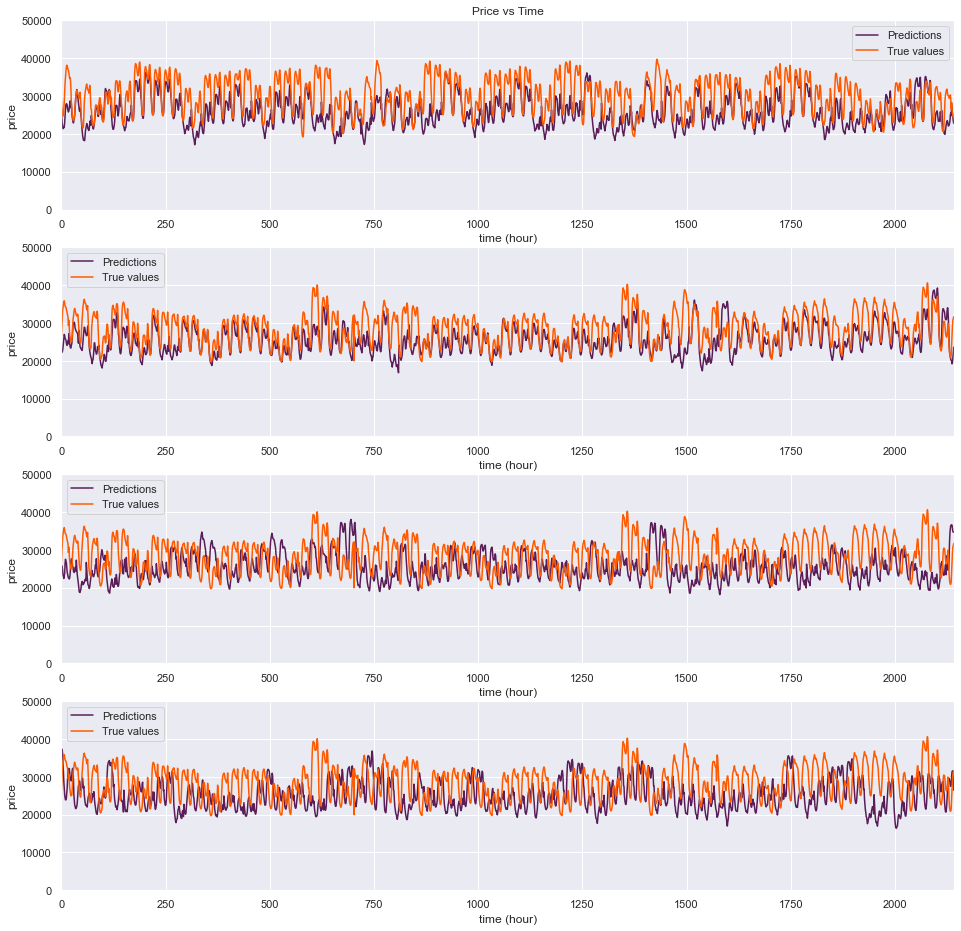

In [19]:
fig = plt.figure(figsize = (16,16))
plt.subplot(411)
plt.plot(prediction_ucnn_load_24[0: len(prediction_ucnn_load_24)//4], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[0: len(prediction_ucnn_load_24)//4], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load_24)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()

plt.subplot(412)
plt.plot(prediction_ucnn_load_24[len(prediction_ucnn_load_24)//4: len(prediction_ucnn_load_24)//2], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[len(prediction_ucnn_load_24)//4: len(prediction_ucnn_load_24)//2], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load_24)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.legend()

plt.subplot(413)
plt.plot(prediction_ucnn_load_24[len(prediction_ucnn_load_24)//2: 3*len(prediction_ucnn_load_24)//4], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[len(prediction_ucnn_load_24)//4: len(prediction_ucnn_load_24)//2], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load_24)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.legend()

plt.subplot(414)
plt.plot(prediction_ucnn_load_24[3*len(prediction_ucnn_load_24)//4: len(prediction_ucnn_load_24)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[len(prediction_ucnn_load_24)//4: len(prediction_ucnn_load_24)//2], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_ucnn_load_24)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.legend()

print("MSE : ", mean_squared_error(y_test_load_ucnn_unscaled[:8568], prediction_ucnn_load_24[:8568]))

MAPE_1 = np.mean(np.abs((y_test_load_ucnn_unscaled[:8568] - prediction_ucnn_load_24[:8568]) / y_test_load_ucnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

In [7]:
# saving model
ucnn_load_model.save('ucnn_load_model')

INFO:tensorflow:Assets written to: ucnn_load_model\assets


### 3.3.2.3 Multivariate CNN 24 hours by 24 hours

In [8]:
df_load_multi = energy[['total_load_actual','month','day','hour','temp_mean','pressure','humidity',
                       'wind_speed', 'clouds_all_pop']]
df_load_multi.head()

,total_load_actual,month,day,hour,temp_mean,pressure,humidity,wind_speed,clouds_all_pop
time,,,,,,,,,
2015-01-01 00:00:00,25385.0,1,3,0,271.8,1010.0,79.0,1.1,0.0
2015-01-01 01:00:00,24382.0,1,3,1,271.8,1010.0,79.0,1.1,0.0
2015-01-01 02:00:00,22734.0,1,3,2,271.4,1011.0,79.0,1.5,0.0
2015-01-01 03:00:00,21286.0,1,3,3,271.4,1011.0,79.0,1.5,0.0
2015-01-01 04:00:00,20264.0,1,3,4,271.4,1011.0,79.0,1.5,0.0


In [9]:
df_load_multi['hour_sin'] = np.sin(2*np.pi*df_load_multi.hour / 24)
df_load_multi['hour_cos'] = np.cos(2*np.pi*df_load_multi.hour / 24)

df_load_multi['month_sin'] = np.sin(2*np.pi*df_load_multi.month / 12)
df_load_multi['month_cos'] = np.cos(2*np.pi*df_load_multi.month / 12)

df_load_multi['day_sin'] = np.sin(2*np.pi*df_load_multi.day / 7)
df_load_multi['day_cos'] = np.cos(2*np.pi*df_load_multi.day / 7)

df_load_multi.drop(['hour','month', 'day'], 1, inplace = True)

df_load_multi.head()

<ipython-input-9-1773c10c3148>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_load_multi['hour_sin'] = np.sin(2*np.pi*df_load_multi.hour / 24)
<ipython-input-9-1773c10c3148>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_load_multi['hour_cos'] = np.cos(2*np.pi*df_load_multi.hour / 24)
<ipython-input-9-1773c10c3148>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

,total_load_actual,temp_mean,pressure,humidity,wind_speed,clouds_all_pop,hour_sin,hour_cos,month_sin,month_cos,day_sin,day_cos
time,,,,,,,,,,,,
2015-01-01 00:00:00,25385.0,271.8,1010.0,79.0,1.1,0.0,0.000000,1.000000,0.5,0.866025,0.433884,-0.900969
2015-01-01 01:00:00,24382.0,271.8,1010.0,79.0,1.1,0.0,0.258819,0.965926,0.5,0.866025,0.433884,-0.900969
2015-01-01 02:00:00,22734.0,271.4,1011.0,79.0,1.5,0.0,0.500000,0.866025,0.5,0.866025,0.433884,-0.900969
2015-01-01 03:00:00,21286.0,271.4,1011.0,79.0,1.5,0.0,0.707107,0.707107,0.5,0.866025,0.433884,-0.900969
2015-01-01 04:00:00,20264.0,271.4,1011.0,79.0,1.5,0.0,0.866025,0.500000,0.5,0.866025,0.433884,-0.900969


In [10]:
def predict_24h_multi(X_test, model, n_time_steps):
    '''
    This function is to create prediction based on X_test.
    It will predict the next 24 hours each 24 hour based on the last n_time_steps values.
    It is made for multivariate models.
    '''
    pred = []
    for hour in range(0, len(X_test)-24, 24):    
        sample = np.reshape(X_test[hour], (1, X_test[0].shape[0], X_test[0].shape[1]))   
        pred_temp_list = []
        for i in range(24):
            pred_temp = model.predict(sample)
            pred_temp = np.reshape(pred_temp, (1,1,1))
            pred.append(pred_temp[0,0,0])
            sample = np.reshape(X_test[hour+i+1], (1, X_test[0].shape[0], X_test[0].shape[1]))
            pred_temp_list.append(pred_temp[0,0,0])
            sample[0,n_time_steps-i-1:n_time_steps,0] = pred_temp_list
    return pred

In [11]:
# Separation test/train (75% / 25%)
df_load_multi_train = df_load_multi[:'2017-12-31']
df_load_multi_test = df_load_multi['2018-01-01':]

# Scaled
standard_scaler_mcnn = StandardScaler()
df_load_multi_train = standard_scaler_mcnn.fit_transform(df_load_multi_train)
df_load_multi_test = standard_scaler_mcnn.transform(df_load_multi_test)

# Same kind of function as before, but taking multi parameters.

def create_conv_dataset(dataset, n_timesteps):
#    X = np.delete(dataset, 8, axis = 1)
    dataX = []
    dataY = []
    for i in range(len(dataset) - n_timesteps - 1):
#        x = X[i:i+n_timesteps, :]
        x = dataset[i:i+n_timesteps, :]
        y = dataset[i + n_timesteps, 0]
        dataY.append(y)
        dataX.append(x)
    return np.array(dataX), np.array(dataY)

X_train_load_mcnn, y_train_load_mcnn = create_conv_dataset(np.array(df_load_multi_train), 168)
X_test_load_mcnn, y_test_load_mcnn = create_conv_dataset(np.array(df_load_multi_test), 168)

print(X_train_load_mcnn.shape)
print(y_train_load_mcnn.shape)

(26135, 168, 12)
(26135,)


In [12]:
mcnn_load_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(16, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(32, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1)
])

mcnn_load_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
mcnn_load_model.fit(X_train_load_mcnn, y_train_load_mcnn, epochs = 100, validation_split = .15, batch_size = 32, verbose = 1)

Epoch 1/100
695/695 [==============================] - 4s 5ms/step - loss: 0.1987 - val_loss: 0.0908
Epoch 2/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0685 - val_loss: 0.0622
Epoch 3/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0474 - val_loss: 0.0414
Epoch 4/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0372 - val_loss: 0.0378
Epoch 5/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0316 - val_loss: 0.0389
Epoch 6/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0291 - val_loss: 0.0327
Epoch 7/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0261 - val_loss: 0.0236
Epoch 8/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0240 - val_loss: 0.0288
Epoch 9/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0234 - val_loss: 0.0193
Epoch 10/100
695/695 [==============================] - 3s 5ms/step - loss: 0.0221 - val_lo

695/695 [==============================] - 4s 5ms/step - loss: 0.0114 - val_loss: 0.0132
Epoch 82/100
695/695 [==============================] - 5s 7ms/step - loss: 0.0117 - val_loss: 0.0135
Epoch 83/100
695/695 [==============================] - 5s 7ms/step - loss: 0.0118 - val_loss: 0.0151
Epoch 84/100
695/695 [==============================] - 5s 7ms/step - loss: 0.0118 - val_loss: 0.0155
Epoch 85/100
695/695 [==============================] - 4s 6ms/step - loss: 0.0112 - val_loss: 0.0143
Epoch 86/100
695/695 [==============================] - 4s 5ms/step - loss: 0.0114 - val_loss: 0.0146
Epoch 87/100
695/695 [==============================] - 4s 5ms/step - loss: 0.0115 - val_loss: 0.0132
Epoch 88/100
695/695 [==============================] - 4s 5ms/step - loss: 0.0115 - val_loss: 0.0145
Epoch 89/100
695/695 [==============================] - 4s 6ms/step - loss: 0.0116 - val_loss: 0.0142
Epoch 90/100
695/695 [==============================] - 4s 6ms/step - loss: 0.0116 - val_loss: 

In [31]:
prediction_load_mcnn = mcnn_load_model.predict(X_test_load_mcnn)

prediction_load_mcnn = np.sqrt(standard_scaler_mcnn.var_[0])*prediction_load_mcnn + standard_scaler_mcnn.mean_[0]

y_test_mcnn_unscaled = np.sqrt(standard_scaler_mcnn.var_[0])*y_test_load_mcnn + standard_scaler_mcnn.mean_[0]

In [45]:
list1 = list(range(len(prediction_load_mcnn)//4,len(prediction_load_mcnn)//2))
list2 = list(range(len(prediction_load_mcnn)//2,3*len(prediction_load_mcnn)//4))
list3 = list(range(3*len(prediction_load_mcnn)//4,len(prediction_load_mcnn)))

MSE :  312115.81795432075
Mean Absolute Prediction Error : 18.72%


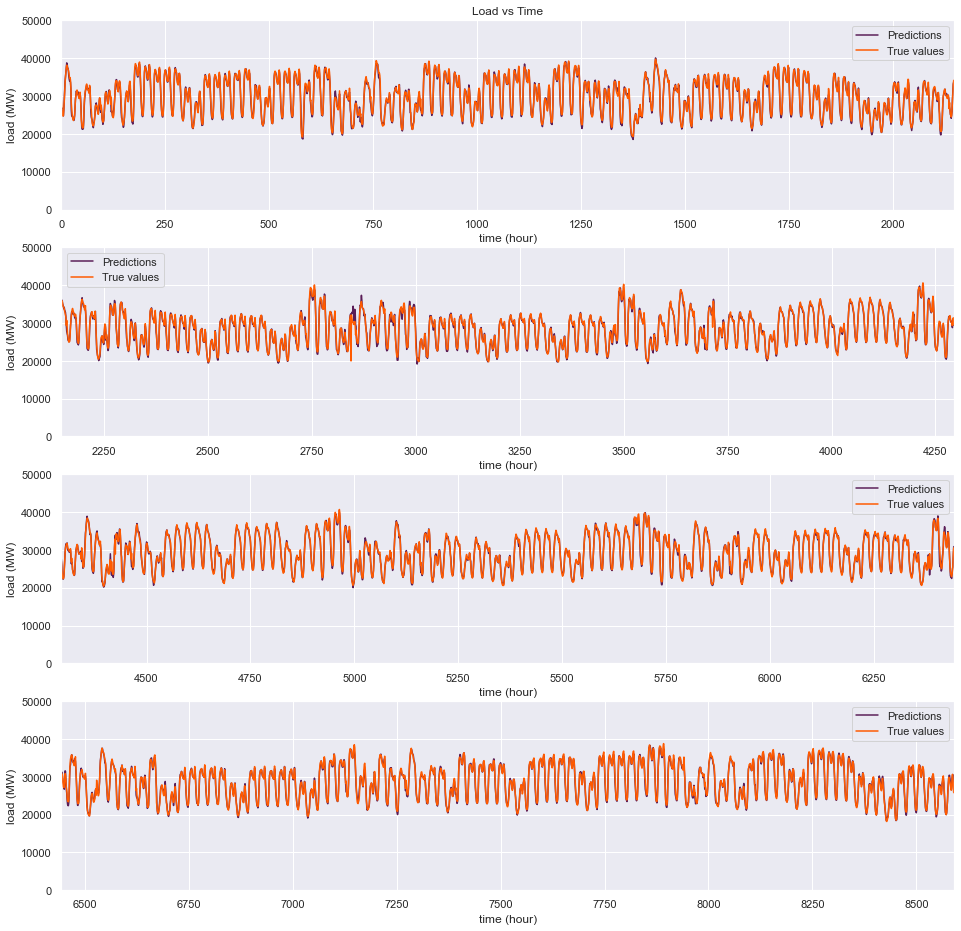

In [48]:
fig = plt.figure(figsize = (16,16))
plt.subplot(411)
plt.plot(prediction_load_mcnn[0: len(prediction_load_mcnn)//4], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[0: len(prediction_load_mcnn)//4], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(prediction_load_mcnn)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('load (MW)')
plt.title('Load vs Time')
plt.legend()

plt.subplot(412)
plt.plot(list1,prediction_load_mcnn[len(prediction_load_mcnn)//4: len(prediction_load_mcnn)//2], color = '#5a1d57', label = 'Predictions')
plt.plot(list1,y_test_mcnn_unscaled[len(prediction_load_mcnn)//4: len(prediction_load_mcnn)//2], color = '#ff5a00', label = 'True values')
plt.xlim(len(prediction_load_mcnn)//4,len(prediction_load_mcnn)//2)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('load (MW)')
plt.legend()

plt.subplot(413)
plt.plot(list2,prediction_load_mcnn[len(prediction_load_mcnn)//2: 3*len(prediction_load_mcnn)//4], color = '#5a1d57', label = 'Predictions')
plt.plot(list2,y_test_mcnn_unscaled[len(prediction_load_mcnn)//2: 3*len(prediction_load_mcnn)//4], color = '#ff5a00', label = 'True values')
plt.xlim(len(prediction_load_mcnn)//2,3*len(prediction_load_mcnn)//4)
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('load (MW)')
plt.legend()

plt.subplot(414)
plt.plot(list3,prediction_load_mcnn[3*len(prediction_load_mcnn)//4: len(prediction_load_mcnn)], color = '#5a1d57', label = 'Predictions')
plt.plot(list3,y_test_mcnn_unscaled[3*len(prediction_load_mcnn)//4: len(prediction_load_mcnn)], color = '#ff5a00', label = 'True values')
plt.xlim(3*len(prediction_load_mcnn)//4,len(prediction_load_mcnn))
plt.ylim(0,50000)
plt.xlabel('time (hour)')
plt.ylabel('load (MW)')
plt.legend()

print("MSE : ", mean_squared_error(y_test_mcnn_unscaled[:8568], prediction_load_mcnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled[:8568] - prediction_load_mcnn[:8568]) / y_test_load_ucnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

In [13]:
# saving model

mcnn_load_model.save('mcnn_load_model')

INFO:tensorflow:Assets written to: mcnn_load_model\assets


### 3.3.2.4 Univariate RNN LSTM 

In [648]:
urnn_load_model = tf.keras.Sequential([
    tf.keras.layers.LSTM(32, return_sequences = True, activation = 'relu'),
    tf.keras.layers.LSTM(64, activation = 'relu'),
    tf.keras.layers.Dense(1)
])
    
urnn_load_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
urnn_load_model.fit(X_train_load_ucnn, y_train_load_ucnn, epochs = 30, validation_split = .15, batch_size = 32, verbose = 1)

Epoch 1/30
695/695 [==============================] - 78s 108ms/step - loss: 8779765760.0000 - val_loss: 0.8544
Epoch 2/30
695/695 [==============================] - 77s 111ms/step - loss: 0.8973 - val_loss: 0.8440
Epoch 3/30
695/695 [==============================] - 74s 106ms/step - loss: 0.8843 - val_loss: 0.8329
Epoch 4/30
695/695 [==============================] - 73s 104ms/step - loss: 0.8713 - val_loss: 0.8219
Epoch 5/30
695/695 [==============================] - 74s 107ms/step - loss: 0.8587 - val_loss: 0.8111
Epoch 6/30
695/695 [==============================] - 73s 105ms/step - loss: 0.8469 - val_loss: 0.8008
Epoch 7/30
695/695 [==============================] - 76s 110ms/step - loss: 0.8357 - val_loss: 0.7912
Epoch 8/30
695/695 [==============================] - 74s 106ms/step - loss: 0.8253 - val_loss: 0.7821
Epoch 9/30
695/695 [==============================] - 74s 107ms/step - loss: 0.8157 - val_loss: 0.7738
Epoch 10/30
695/695 [==============================] - 75s 108ms

In [649]:
pred_load_urnn = predict_24h_uni(X_test_load_ucnn, urnn_load_model)

In [650]:
pred_load_urnn = np.sqrt(scaler_load.var_[0])*np.array(pred_load_urnn) + scaler_load.mean_[0]

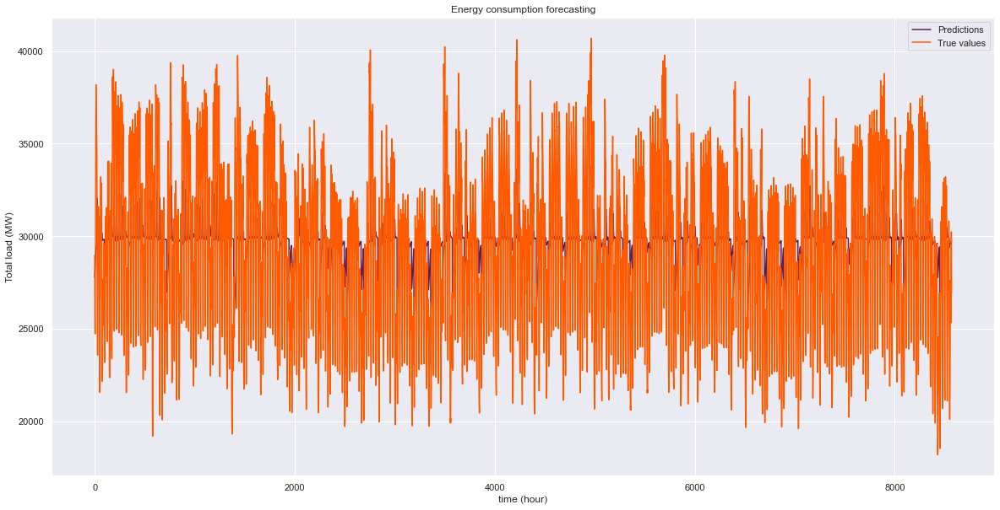

MSE :  21451052.244560882
Mean Absolute Prediction Error : 14.43 %


In [652]:
plt.figure(figsize = (20,10))
plt.plot(pred_load_urnn[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_load_ucnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.xlabel('time (hour)')
plt.ylabel('Total load (MW)')
plt.title('Energy consumption forecasting')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_load_ucnn_unscaled[:8568], pred_load_urnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_load_ucnn_unscaled[:8568] - pred_load_urnn[:8568]) / y_test_load_ucnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error :", round(MAPE_1,2),'%')

### 3.3.2.5 Multivariate RNN LSTM 

In [553]:
mrnn_load_model = tf.keras.Sequential([
    tf.keras.layers.LSTM(32, return_sequences = True, activation = 'relu'),
    tf.keras.layers.LSTM(64, activation = 'relu'),
#    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32),
    tf.keras.layers.Dense(1)
])

mrnn_load_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
mrnn_load_model.fit(X_train_load_mcnn, y_train_load_mcnn, epochs = 5, validation_split = .15, batch_size = 64, verbose = 1)

Epoch 1/5
348/348 [==============================] - 47s 128ms/step - loss: 45708992.0000 - val_loss: 0.4851
Epoch 2/5
348/348 [==============================] - 44s 127ms/step - loss: 0.6175 - val_loss: 0.4523
Epoch 3/5
348/348 [==============================] - 49s 141ms/step - loss: 0.5428 - val_loss: 0.4193
Epoch 4/5
348/348 [==============================] - 46s 133ms/step - loss: 0.5061 - val_loss: 0.4014
Epoch 5/5
348/348 [==============================] - 47s 135ms/step - loss: 0.5697 - val_loss: 0.3866


In [514]:
pred_load_mrnn = predict_24h_multi(X_test_load_mcnn, mrnn_load_model, 168)

In [516]:
pred_load_mrnn = np.sqrt(standard_scaler_mcnn.var_[0])*np.array(pred_load_mrnn) + standard_scaler_mcnn.mean_[0]

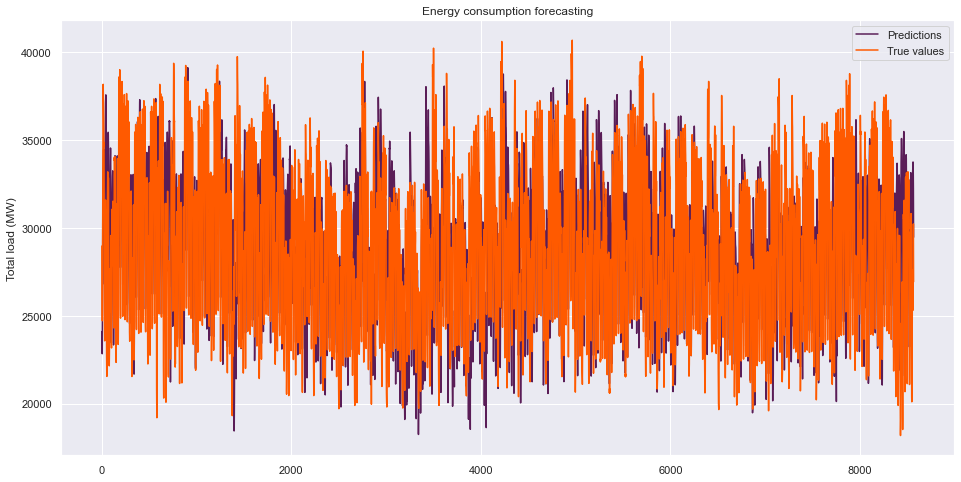

MSE :  12043023.76758606
Mean Absolute Prediction Error : 9.24%


In [521]:
plt.figure(figsize = (20,10))
plt.plot(pred_load_mrnn[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.ylabel('Total load (MW)')
plt.title('Energy consumption forecasting')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_mcnn_unscaled[:8568], pred_load_mrnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_load_mrnn[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

### Saving models

In [659]:
ucnn_load_model.save('ucnn_load_model')
mcnn_load_model.save('mcnn_load_model')

urnn_load_model.save('urnn_load_model')
mrnn_load_model.save('mrnn_load_model')


INFO:tensorflow:Assets written to: ucnn_load_model/assets
INFO:tensorflow:Assets written to: mcnn_load_model/assets
INFO:tensorflow:Assets written to: urnn_load_model/assets
INFO:tensorflow:Assets written to: mrnn_load_model/assets


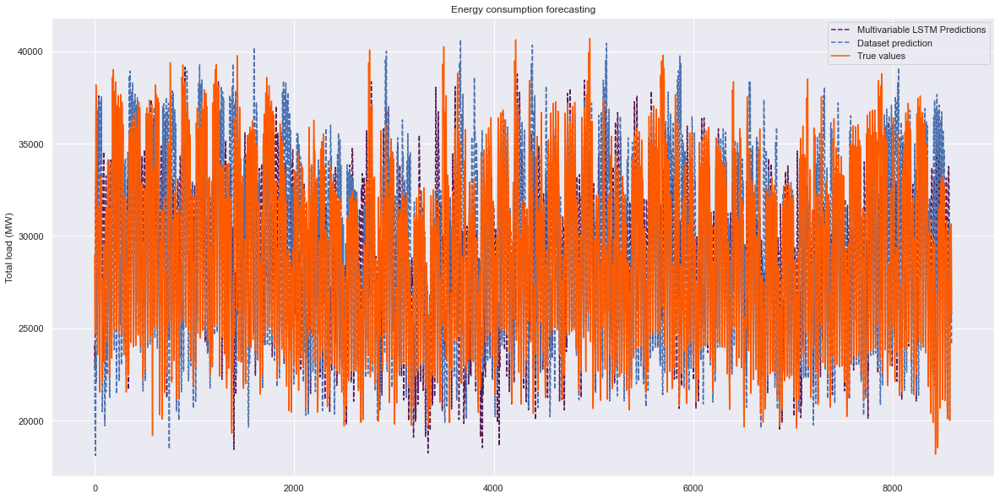

In [548]:
**How to improve**

However, we only have three years to train our model, meaning only 3 datas rows for each holidays to train the model, which is quite few. We can imagine the results would not be that much better.

**Different set of parameters for each hour (p,d,q)(P,D,Q)**plt.figure(figsize = (20,10))
plt.plot(pred_load_mrnn[:8591],'--', color = '#5a1d57', label = 'Multivariable LSTM Predictions')
plt.plot(dataset_load_prediction[:8591],'--', label ='Dataset prediction')
plt.plot(y_test_mcnn_unscaled[:8591], color = '#ff5a00', label = 'True values')
plt.ylabel('Total load (MW)')
plt.title('Energy consumption forecasting')
plt.legend()
plt.show()

In [550]:
print("MSE Dataset prediction & True values : ", mean_squared_error(y_test_mcnn_unscaled[:8591], dataset_load_prediction[:8591]))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled[:8591] - dataset_load_prediction[:8591]) / y_test_mcnn_unscaled[:8591])) * 100
print("Mean Absolute Prediction Error Dataset prediction & True values :", round(MAPE_1,2), '%')

MSE Dataset prediction & True values :  14378942.24863229
Mean Absolute Prediction Error Dataset prediction & True values : 9.0 %


## 3.3.2. Price prediction

First, we want to see the repartition of the prices.

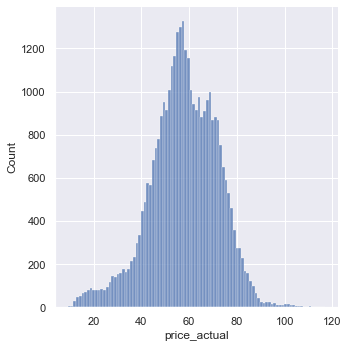

In [6]:
sns.displot(energy.price_actual);

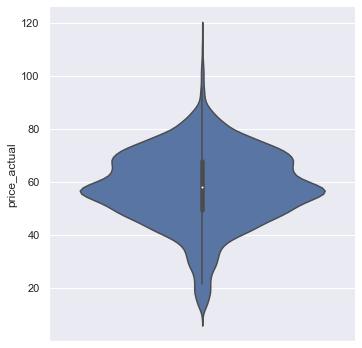

In [9]:
sns.catplot(y = 'price_actual', data = energy, kind = 'violin');

Two functions that we will use later.

In [82]:
def predict_24h_uni(X_test, model):
    '''
    This function is to create prediction based on X_test.
    It will predict the next 24 hours each 24 hour based on the last n_time_steps values.
    It is made for univariate models.
    '''
    pred = []
    for hour in range(0, len(X_test)-24, 24):
        sample = np.reshape(X_test[hour], (1, X_test[0].shape[0], X_test[0].shape[1]))
        for i in range(24):
            next_step = model.predict(sample)
            next_step = np.reshape(next_step, (1,1,1))
            sample = np.concatenate([sample[:,1:,:], next_step], axis = 1)
            pred.append(next_step[0,0,0])
    return pred

In [83]:
def predict_24h_multi(X_test, model, n_time_steps):
    '''
    This function is to create prediction based on X_test.
    It will predict the next 24 hours each 24 hour based on the last n_time_steps values.
    It is made for multivariate models.
    '''
    pred = []
    for hour in range(0, len(X_test)-24, 24):    
        sample = np.reshape(X_test[hour], (1, X_test[0].shape[0], X_test[0].shape[1]))   
        pred_temp_list = []
        for i in range(24):
            pred_temp = model.predict(sample)
            pred_temp = np.reshape(pred_temp, (1,1,1))
            pred.append(pred_temp[0,0,0])
            sample = np.reshape(X_test[hour+i+1], (1, X_test[0].shape[0], X_test[0].shape[1]))
            pred_temp_list.append(pred_temp[0,0,0])
            sample[0,n_time_steps-i-1:n_time_steps,0] = pred_temp_list
    return pred

### 3.3.2.1. Univariate CNN

First, we are going to make prediction, only considering the previous values of the price as a feature. Firstly, we will predict the price hour by hour. Then, secondly, we will try to predict 24 hours by 24 hours, which is our initial goal. Hence, in this second case, the model will work on its own predictions.

In [85]:
# Datas to consider
energy_price = energy[['price_actual']]

# Separation test/train (75% / 25%)
energy_price_train = energy_price[:'2017-12-31']
energy_price_test = energy_price['2018-01-01':]

# We use a QuantileTransformer such that the probability density function of the feature
# will be mapped to a uniform or Gaussian distribution.
scaler_price = preprocessing.StandardScaler()
energy_price_train = scaler_price.fit_transform(energy_price_train)
energy_price_test = scaler_price.transform(energy_price_test)

In [86]:
# Creation of a function, that from a dataset, is going to create :
# a target dataset (price) and a features dataset made of the target
# dataset at the n_timesteps previous steps

def create_dataset(dataset, n_timesteps):
    dataX, dataY = [], []
    for i in range(len(dataset) - n_timesteps - 1):
        x = dataset[i:i+n_timesteps, 0] # Price between t-n and t-1
        y = dataset[i + n_timesteps, 0] # Price at t
        dataX.append(x)
        dataY.append(y)
    return np.array(dataX), np.array(dataY)

X_train_ucnn, y_train_ucnn = create_dataset(energy_price_train, 168) # 168 steps = a week
X_test_ucnn, y_test_ucnn = create_dataset(energy_price_test, 168)

X_train_ucnn = np.expand_dims(X_train_ucnn, 2) # to indicate that each 'individual' as only one feature
X_test_ucnn = np.expand_dims(X_test_ucnn, 2)

In [6]:
# Creation of the model
'''
ucnn_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(16, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(32, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1)
])

ucnn_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
ucnn_model.fit(X_train_ucnn, y_train_ucnn, epochs = 50, validation_split = .15, batch_size = 32, verbose = 1)
#ucnn_model.summary()
'''

Epoch 1/50
695/695 [==============================] - 4s 4ms/step - loss: 0.1271 - val_loss: 0.0651
Epoch 2/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0454 - val_loss: 0.0409
Epoch 3/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0366 - val_loss: 0.0362
Epoch 4/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0330 - val_loss: 0.0327
Epoch 5/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0312 - val_loss: 0.0316
Epoch 6/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0301 - val_loss: 0.0354
Epoch 7/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0292 - val_loss: 0.0306
Epoch 8/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0291 - val_loss: 0.0324
Epoch 9/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0276 - val_loss: 0.0348
Epoch 10/50
695/695 [==============================] - 3s 4ms/step - loss: 0.0277 - val_loss: 0.0324

In [60]:
ucnn_model = load_model('ucnn_model')
prediction_ucnn = scaler_price.inverse_transform(ucnn_model.predict(X_test_ucnn))
y_test_ucnn_unscaled = scaler_price.inverse_transform(np.reshape(y_test_ucnn, (-1,1)))

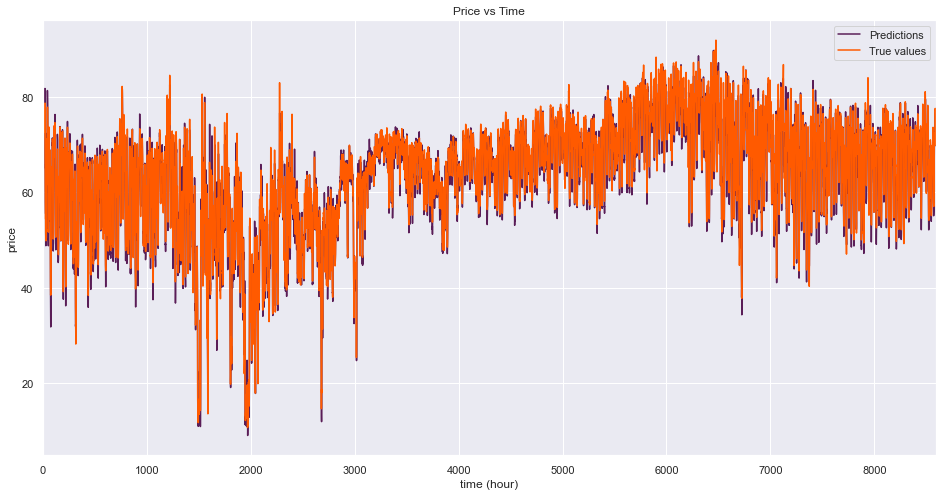

MSE :  5.686017462056575
Mean Absolute Prediction Error : 3.03%


In [61]:
# Checking hour by hour predictions of the model vs true values

plt.figure(figsize = (16,8))
plt.plot(prediction_ucnn, color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_ucnn_unscaled, color = '#ff5a00', label = 'True values')
plt.xlim(0,len(y_test_ucnn))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_ucnn_unscaled, prediction_ucnn))

MAPE_1 = np.mean(np.abs((y_test_ucnn_unscaled - prediction_ucnn) / y_test_ucnn_unscaled)) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

These are good results. However, as staded previously, our goal is to predict the next 24 hours, not just hour by hour. THis is what we are going to try now.

In [41]:
pred_ucnn = predict_24h_uni(X_test_ucnn, ucnn_model)
pred_ucnn = scaler_price.inverse_transform(np.reshape(pred_ucnn,(-1,1)))

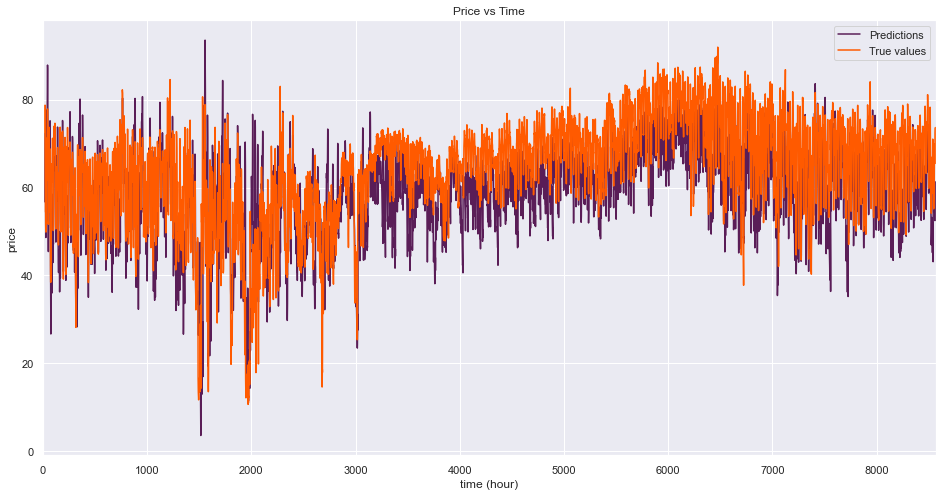

MSE :  94.04705537503722
Mean Absolute Prediction Error : 12.65%


In [42]:
# Checking 24h by 24h predictions of the model vs true values

plt.figure(figsize = (16,8))
plt.plot(pred_ucnn[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_ucnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_ucnn))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_ucnn_unscaled[:8568], pred_ucnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_ucnn_unscaled[:8568] - pred_ucnn[:8568]) / y_test_ucnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

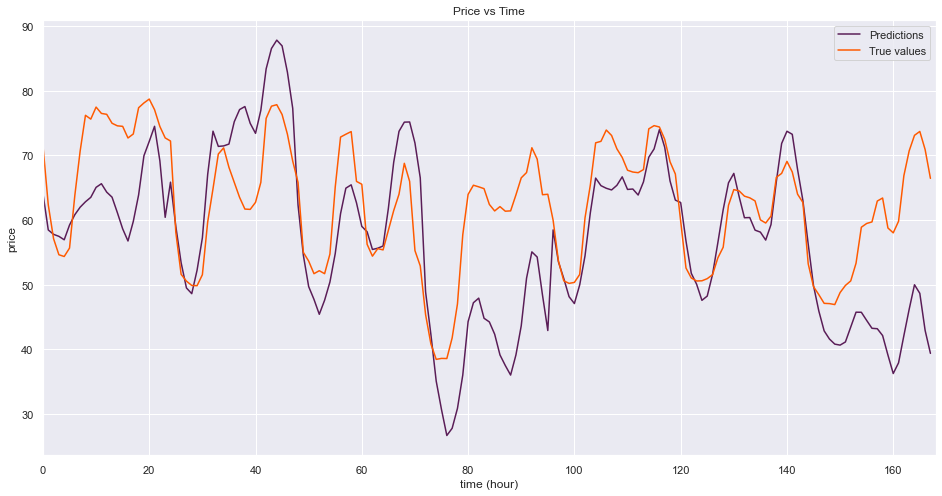

In [43]:
# Zoom on first week
i = 0

plt.figure(figsize = (16,8))
plt.plot(pred_ucnn[24*i:24*(i+7)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_ucnn_unscaled[24*i:24*(i+7)], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_ucnn[24*i:24*(i+7)]))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

### 3.3.2.2. Multivariate CNN

We know want to to the same thing, but considerinng the other features. We will select features that we can predict (load for instance) and that we know of (hour, month, day).

In [12]:
energy_price_multi = energy[[
    'price_actual',
    'forecast_solar_day_ahead',
    'forecast_wind_onshore_day_ahead',
    'total_load_forecast',
    'day','hour','month'
]]

# We add the wind and solar forecast in a new column
energy_price_multi['forecast_renewable'] = (energy_price_multi.forecast_solar_day_ahead +
                                            energy_price_multi.forecast_wind_onshore_day_ahead)
energy_price_multi.drop(['forecast_solar_day_ahead','forecast_wind_onshore_day_ahead'],1, inplace = True)

# Also, we can create 2 new features based on forecast_renewable and the total load forecast.
# Indeed, as previously discussed, the fossil energies will provide the difference between renewable
# energies and the load (if w simplify the problem), hence it is a direct indicator for the price.
energy_price_multi['difference'] = (energy_price_multi.forecast_renewable -
                                    energy_price_multi.total_load_forecast)
energy_price_multi['ratio'] = (energy_price_multi.forecast_renewable /
                               energy_price_multi.total_load_forecast)

# We want to transform the time parameters so they are made cyclic.
# Indeed, although there is a proximity in real life between hour 23 and hour 00, the numerical
# difference would make it difficult for the model to understand it.
energy_price_multi['hour_sin'] = np.sin(2*np.pi*energy_price_multi.hour / 24)
energy_price_multi['hour_cos'] = np.cos(2*np.pi*energy_price_multi.hour / 24)

energy_price_multi['month_sin'] = np.sin(2*np.pi*energy_price_multi.month / 12)
energy_price_multi['month_cos'] = np.cos(2*np.pi*energy_price_multi.month / 12)

energy_price_multi['day_sin'] = np.sin(2*np.pi*energy_price_multi.day / 7)
energy_price_multi['day_cos'] = np.cos(2*np.pi*energy_price_multi.day / 7)

energy_price_multi.drop(['hour','month', 'day'], 1, inplace = True)

# we need to shift by 24h the first values of forecast wind and solar, since they are prediction
# as a consequence, we will delete the first 24 lines of the resulting dataframe (nan)

energy_price_multi.forecast_renewable = energy_price_multi.forecast_renewable.shift(24)

energy_price_multi = energy_price_multi['2015-01-02':]

energy_price_multi.head()

<ipython-input-12-054b65442d91>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  energy_price_multi['forecast_renewable'] = (energy_price_multi.forecast_solar_day_ahead +
D:\Anaconda\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
<ipython-input-12-054b65442d91>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

,price_actual,total_load_forecast,forecast_renewable,difference,ratio,hour_sin,hour_cos,month_sin,month_cos,day_sin,day_cos
time,,,,,,,,,,,
2015-01-02 00:00:00,64.02,27309.0,6453.0,-13975.0,0.488264,0.000000,1.000000,0.5,0.866025,-0.433884,-0.900969
2015-01-02 01:00:00,58.46,25397.0,5872.0,-12644.0,0.502146,0.258819,0.965926,0.5,0.866025,-0.433884,-0.900969
2015-01-02 02:00:00,54.70,23640.0,5462.0,-11222.0,0.525296,0.500000,0.866025,0.5,0.866025,-0.433884,-0.900969
2015-01-02 03:00:00,54.91,22638.0,5153.0,-11082.0,0.510469,0.707107,0.707107,0.5,0.866025,-0.433884,-0.900969
2015-01-02 04:00:00,53.07,22238.0,4870.0,-10897.0,0.509983,0.866025,0.500000,0.5,0.866025,-0.433884,-0.900969


In [63]:
# Separation test/train (75% / 25%)
energy_price_multi_train = energy_price_multi[:'2017-12-31']
energy_price_multi_test = energy_price_multi['2018-01-01':]

# Scaled
standard_scaler = StandardScaler()
energy_price_multi_train = standard_scaler.fit_transform(energy_price_multi_train)
energy_price_multi_test = standard_scaler.transform(energy_price_multi_test)

# Same kind of function as before, but taking multi parameters.

def create_conv_dataset(dataset, n_timesteps):
#    X = np.delete(dataset, 8, axis = 1)
    dataX = []
    dataY = []
    for i in range(len(dataset) - n_timesteps - 1):
#        x = X[i:i+n_timesteps, :]
        x = dataset[i:i+n_timesteps, :]
        y = dataset[i + n_timesteps, 0]
        dataY.append(y)
        dataX.append(x)
    return np.array(dataX), np.array(dataY)

X_train_mcnn, y_train_mcnn = create_conv_dataset(np.array(energy_price_multi_train), 168)
X_test_mcnn, y_test_mcnn = create_conv_dataset(np.array(energy_price_multi_test), 168)

print(X_train_mcnn.shape)
print(y_train_mcnn.shape)

(26111, 168, 11)
(26111,)


In [15]:
# Creation of the model
'''
mcnn_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(16, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(32, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1)
])

mcnn_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
mcnn_model.fit(X_train_mcnn, y_train_mcnn, epochs = 50, validation_split = .15, batch_size = 32, verbose = 1)
#mcnn_model.summary()
'''

Epoch 1/50
694/694 [==============================] - 4s 5ms/step - loss: 0.1560 - val_loss: 0.1013
Epoch 2/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0770 - val_loss: 0.0739
Epoch 3/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0564 - val_loss: 0.0643
Epoch 4/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0477 - val_loss: 0.0570
Epoch 5/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0422 - val_loss: 0.0507
Epoch 6/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0385 - val_loss: 0.0474
Epoch 7/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0358 - val_loss: 0.0443
Epoch 8/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0339 - val_loss: 0.0489
Epoch 9/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0323 - val_loss: 0.0400
Epoch 10/50
694/694 [==============================] - 3s 5ms/step - loss: 0.0311 - val_loss: 0.0400

In [64]:
# load model
mcnn_model = load_model('mcnn_model')

# unscaled
prediction_mcnn = mcnn_model.predict(X_test_mcnn)

prediction_mcnn = np.sqrt(standard_scaler.var_[0])*prediction_mcnn + standard_scaler.mean_[0]

y_test_mcnn_unscaled = np.sqrt(standard_scaler.var_[0])*y_test_mcnn + standard_scaler.mean_[0]

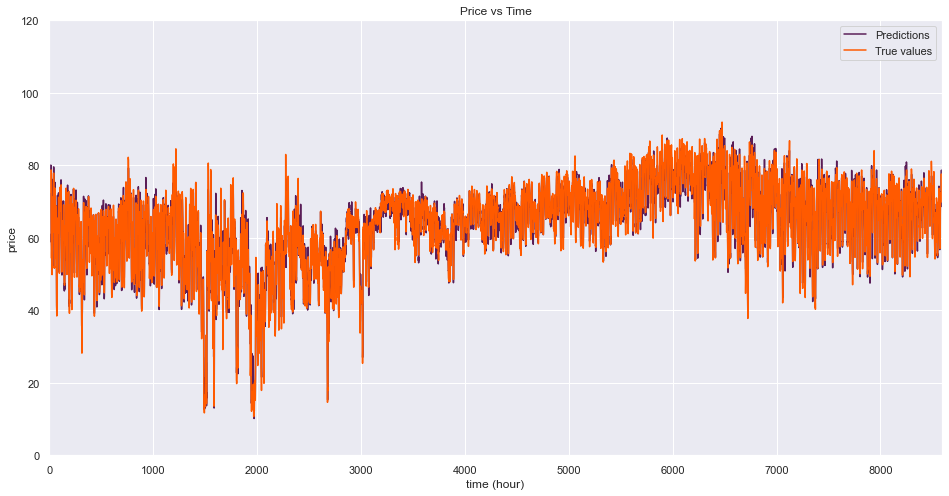

MSE :  6.592581866826558
Mean Absolute Prediction Error : 23.36%


In [65]:
# Checking hour by hour predictions of the model vs true values

plt.figure(figsize = (16,8))
plt.plot(prediction_mcnn, color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled, color = '#ff5a00', label = 'True values')
plt.xlim(0,len(y_test_mcnn_unscaled))
plt.ylim(0,120)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_mcnn_unscaled, prediction_mcnn))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled - prediction_mcnn) / y_test_mcnn_unscaled)) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

Now, as previously, we want to predict the price 24 hours by 24 hours.

In [66]:
pred_mcnn = predict_24h_multi(X_test_mcnn, mcnn_model, 168)
# Unscaled the predictions
pred_mcnn = np.sqrt(standard_scaler.var_[0])*np.array(pred_mcnn) + standard_scaler.mean_[0]

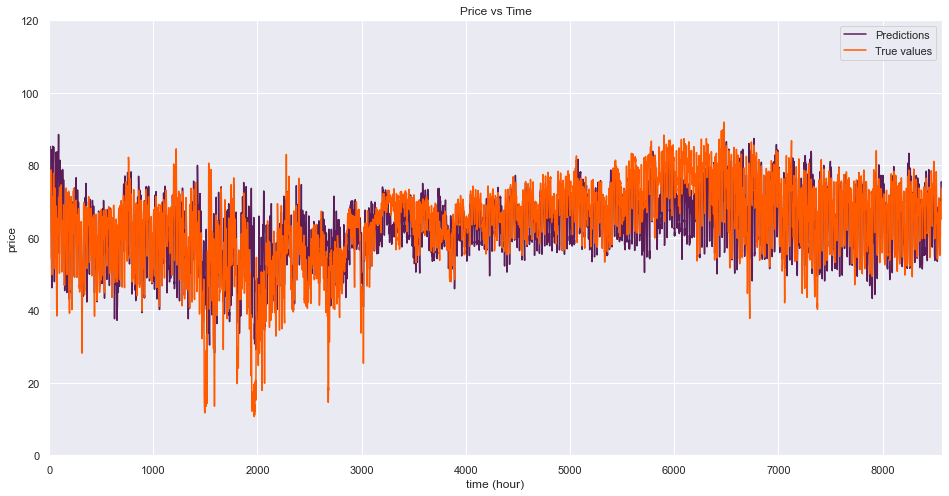

MSE :  51.514558891303494
Mean Absolute Prediction Error : 10.25%


In [67]:
# Checking 24h by 24h predictions of the model vs true values

plt.figure(figsize = (16,8))
plt.plot(pred_mcnn[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_mcnn))
plt.ylim(0,120)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_mcnn_unscaled[:8568], pred_mcnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_mcnn[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

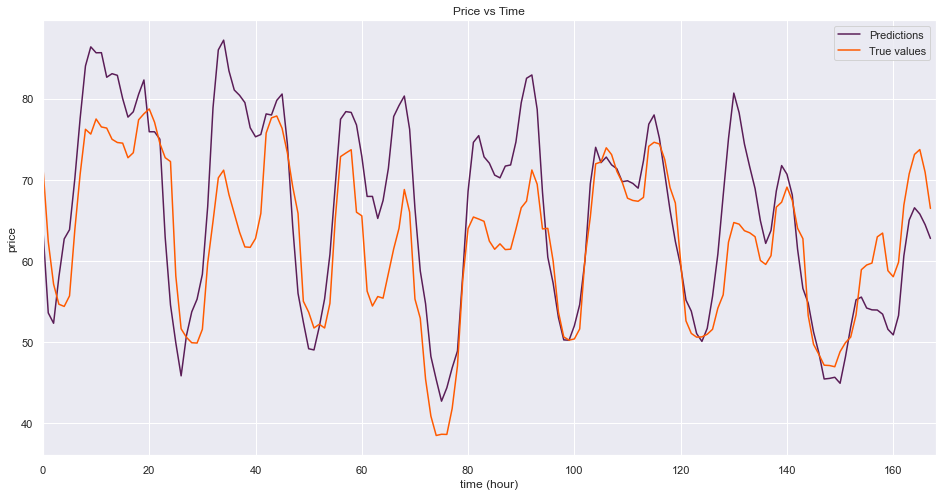

In [22]:
# Zoom on first week
i = 0

plt.figure(figsize = (16,8))
plt.plot(pred_mcnn[24*i:24*(i+7)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[24*i:24*(i+7)], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_mcnn[24*i:24*(i+7)]))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

### 3.3.2.3. Improved Multivariate CNN

We have decent results so far. We would like to push further a multivariate model.

In [25]:
# Creation of the model

'''
mcnn_improved_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(16, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(32, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(64, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64),
    tf.keras.layers.Dense(32),
    tf.keras.layers.Dense(1, activation = 'linear')
])

mcnn_improved_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
mcnn_improved_model.fit(X_train_mcnn, y_train_mcnn, epochs = 100, validation_split = .15, batch_size = 64, verbose = 1)
#ucnn_model.summary()
'''

Epoch 1/100
347/347 [==============================] - 6s 15ms/step - loss: 0.4466 - val_loss: 0.1416
Epoch 2/100
347/347 [==============================] - 5s 15ms/step - loss: 0.1069 - val_loss: 0.1128
Epoch 3/100
347/347 [==============================] - 5s 15ms/step - loss: 0.0768 - val_loss: 0.0935
Epoch 4/100
347/347 [==============================] - 5s 15ms/step - loss: 0.0626 - val_loss: 0.0901
Epoch 5/100
347/347 [==============================] - 5s 15ms/step - loss: 0.0533 - val_loss: 0.0890
Epoch 6/100
347/347 [==============================] - 5s 16ms/step - loss: 0.0484 - val_loss: 0.0808s: 0.04
Epoch 7/100
347/347 [==============================] - 5s 16ms/step - loss: 0.0439 - val_loss: 0.0692
Epoch 8/100
347/347 [==============================] - 6s 18ms/step - loss: 0.0387 - val_loss: 0.0611
Epoch 9/100
347/347 [==============================] - 6s 19ms/step - loss: 0.0377 - val_loss: 0.0666
Epoch 10/100
347/347 [==============================] - 6s 18ms/step - loss

In [68]:
# load model
mcnn_improved_model = load_model('mcnn_improved_model')

pred_mcnn_improved = predict_24h_multi(X_test_mcnn, mcnn_improved_model, 168)
# Unscaled the predictions
pred_mcnn_improved = np.sqrt(standard_scaler.var_[0])*np.array(pred_mcnn_improved) + standard_scaler.mean_[0]

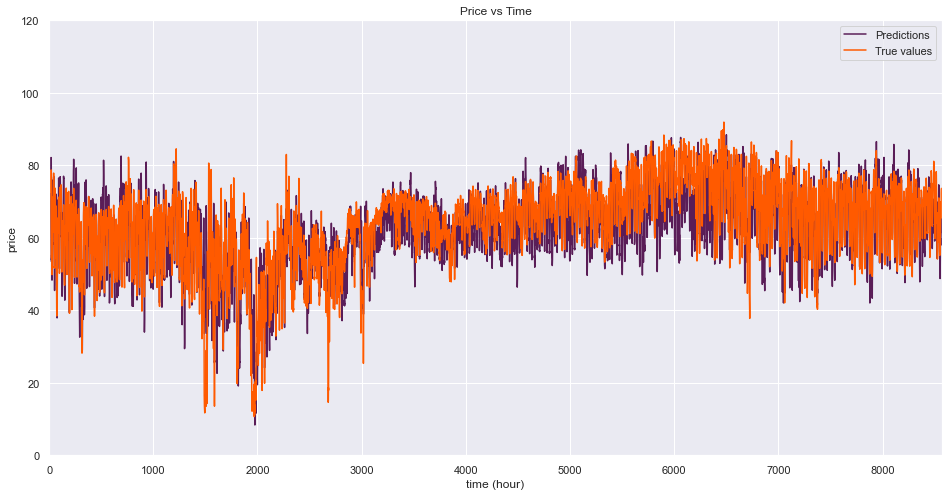

MSE :  42.82001248568352
Mean Absolute Prediction Error : 9.07%


In [69]:
# Checking 24h by 24h predictions of the model vs true values

plt.figure(figsize = (16,8))
plt.plot(pred_mcnn_improved[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_mcnn_improved))
plt.ylim(0,120)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_mcnn_unscaled[:8568], pred_mcnn_improved[:8568]))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_mcnn_improved[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

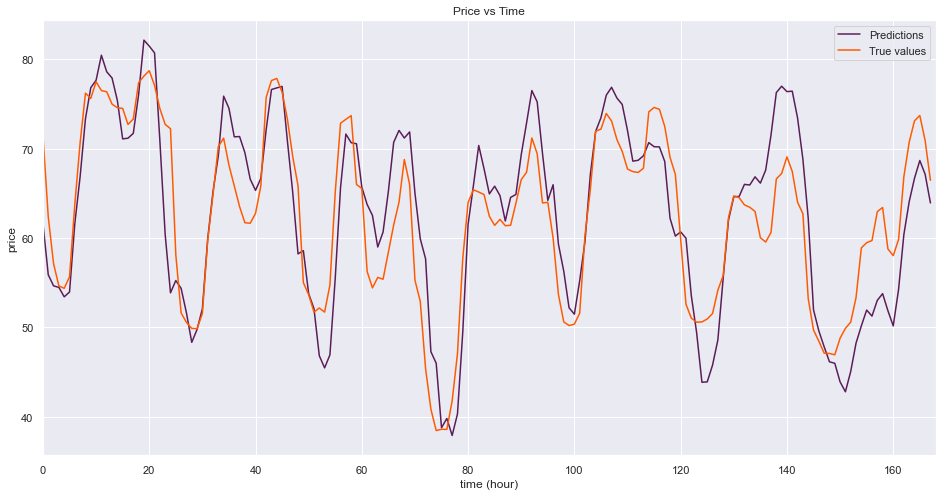

In [70]:
# Zoom on first week
i = 0

plt.figure(figsize = (16,8))
plt.plot(pred_mcnn_improved[24*i:24*(i+7)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[24*i:24*(i+7)], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_mcnn_improved[24*i:24*(i+7)]))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

### 3.3.2.4. Univariate RNN

In [31]:
'''
urnn_model = tf.keras.Sequential([
    tf.keras.layers.LSTM(32, return_sequences = True, activation = 'relu'),
    tf.keras.layers.LSTM(64, activation = 'relu'),
    tf.keras.layers.Dense(1)
])
    
urnn_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
urnn_model.fit(X_train_ucnn, y_train_ucnn, epochs = 50, validation_split = .15, batch_size = 32, verbose = 1)
'''

Epoch 1/50
695/695 [==============================] - 60s 82ms/step - loss: 16660.8008 - val_loss: 0.4281
Epoch 2/50
695/695 [==============================] - 57s 82ms/step - loss: 0.4446 - val_loss: 0.4014
Epoch 3/50
695/695 [==============================] - 59s 85ms/step - loss: 0.4137 - val_loss: 0.3764
Epoch 4/50
695/695 [==============================] - 58s 84ms/step - loss: 0.3965 - val_loss: 0.3614
Epoch 5/50
695/695 [==============================] - 60s 87ms/step - loss: 0.3873 - val_loss: 0.3523
Epoch 6/50
695/695 [==============================] - 61s 88ms/step - loss: 0.3821 - val_loss: 0.3477
Epoch 7/50
695/695 [==============================] - 64s 92ms/step - loss: 0.3788 - val_loss: 0.3446
Epoch 8/50
695/695 [==============================] - 63s 90ms/step - loss: 0.3764 - val_loss: 0.3429
Epoch 9/50
695/695 [==============================] - 63s 90ms/step - loss: 0.3742 - val_loss: 0.3415
Epoch 10/50
695/695 [==============================] - 65s 93ms/step - loss: 0

In [87]:
# load model
urnn_model = load_model('urnn_model')

pred_urnn = predict_24h_uni(X_test_ucnn, urnn_model)
pred_urnn = np.sqrt(scaler_price.var_[0])*np.array(pred_urnn) + scaler_price.mean_[0]

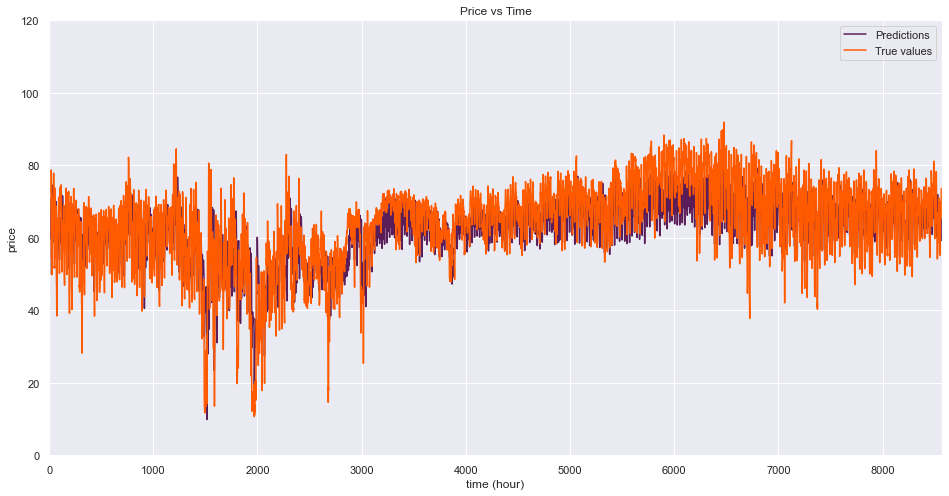

MSE :  53.48503392774627
Mean Absolute Prediction Error : 20.91%


In [89]:
# Checking 24h by 24h predictions of the model vs true values
y_test_ucnn_unscaled = scaler_price.inverse_transform(np.reshape(y_test_ucnn, (-1,1)))

plt.figure(figsize = (16,8))
plt.plot(pred_urnn[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_ucnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_urnn))
plt.ylim(0,120)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_ucnn_unscaled[:8568], pred_urnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_ucnn_unscaled[:8568] - pred_urnn[:8568]) / y_test_ucnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

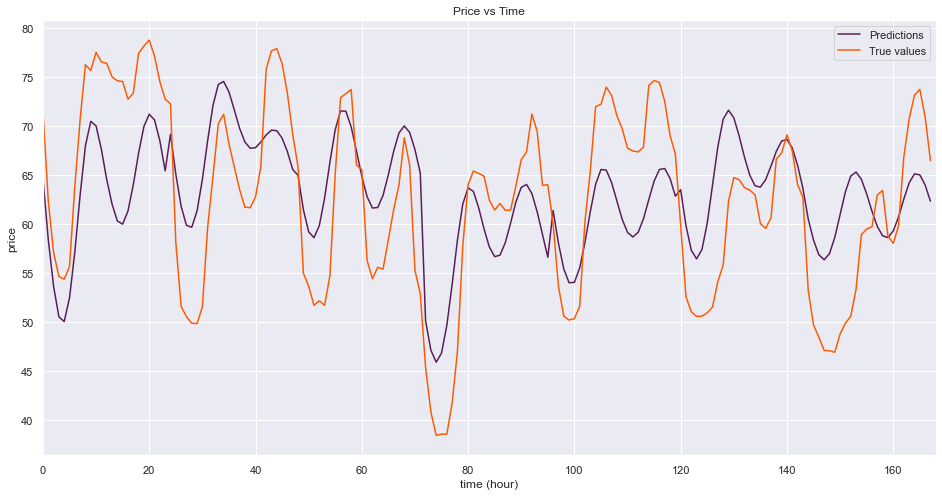

In [75]:
# Zoom on first week
i = 0

plt.figure(figsize = (16,8))
plt.plot(pred_urnn[24*i:24*(i+7)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[24*i:24*(i+7)], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_urnn[24*i:24*(i+7)]))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

### 3.3.2.5. Multivariate RNN

In [77]:
'''
mrnn_model = tf.keras.Sequential([
    tf.keras.layers.LSTM(32, return_sequences = True, activation = 'relu'),
    tf.keras.layers.LSTM(64, activation = 'relu'),
#    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32),
    tf.keras.layers.Dense(1)
])

mrnn_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
mrnn_model.fit(X_train_mcnn, y_train_mcnn, epochs = 100, validation_split = .15, batch_size = 64, verbose = 1)
'''

Epoch 1/100
347/347 [==============================] - 41s 113ms/step - loss: 178277318656.0000 - val_loss: 0.4072
Epoch 2/100
347/347 [==============================] - 44s 128ms/step - loss: 0.4459 - val_loss: 0.3567
Epoch 3/100
347/347 [==============================] - 44s 127ms/step - loss: 0.3620 - val_loss: 0.3086
Epoch 4/100
347/347 [==============================] - 43s 125ms/step - loss: 0.3055 - val_loss: 0.2705
Epoch 5/100
347/347 [==============================] - 44s 128ms/step - loss: 0.2394 - val_loss: 0.1670
Epoch 6/100
347/347 [==============================] - 44s 127ms/step - loss: 0.1459 - val_loss: 0.1274
Epoch 7/100
347/347 [==============================] - 48s 138ms/step - loss: 0.1131 - val_loss: 0.1139
Epoch 8/100
347/347 [==============================] - 49s 142ms/step - loss: 0.0995 - val_loss: 0.1039
Epoch 9/100
347/347 [==============================] - 45s 131ms/step - loss: 0.0895 - val_loss: 0.0998
Epoch 10/100
347/347 [==============================]

In [82]:
# load model
mrnn_model = load_model('mrnn_model')

pred_mrnn = predict_24h_multi(X_test_mcnn, mrnn_model, 168)
pred_mrnn = np.sqrt(standard_scaler.var_[0])*np.array(pred_mrnn) + standard_scaler.mean_[0]

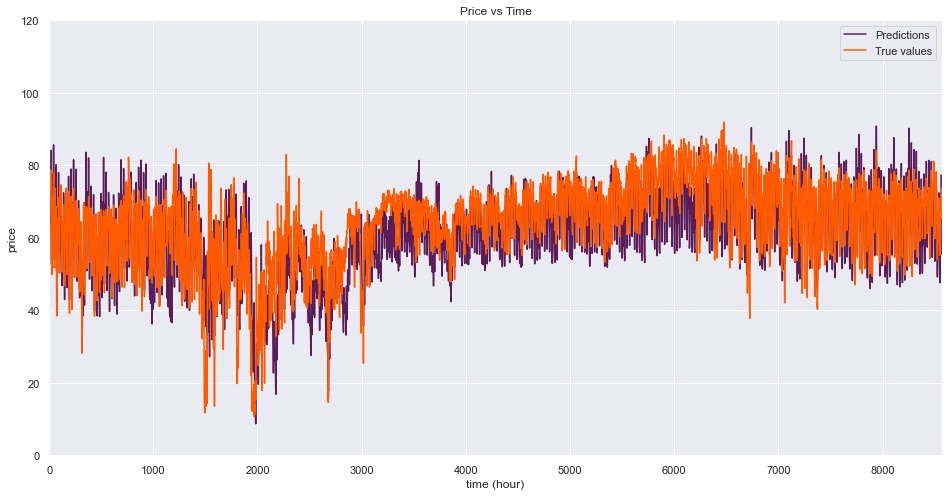

MSE :  57.335241049279546
Mean Absolute Prediction Error : 10.58%


In [83]:
# Checking 24h by 24h predictions of the model vs true values

plt.figure(figsize = (16,8))
plt.plot(pred_mrnn[:8568], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[:8568], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_mrnn))
plt.ylim(0,120)
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

print("MSE : ", mean_squared_error(y_test_mcnn_unscaled[:8568], pred_mrnn[:8568]))

MAPE_1 = np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_mrnn[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

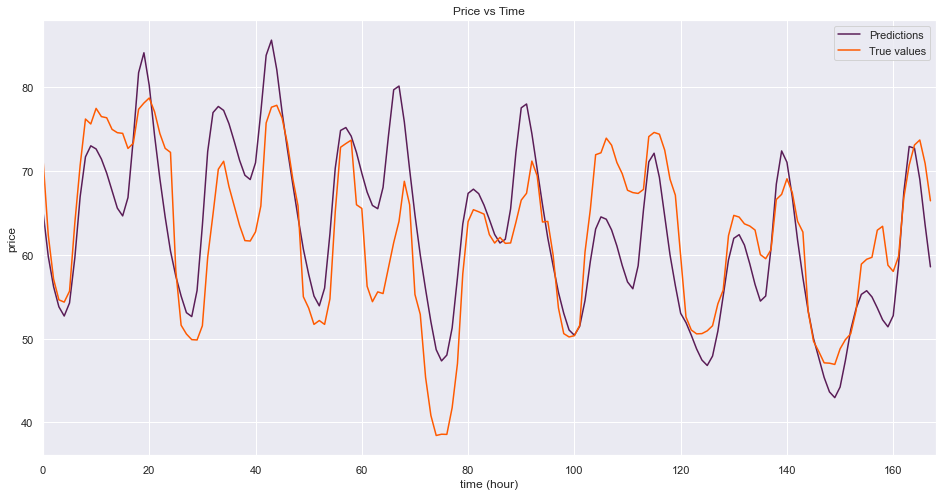

In [88]:
# Zoom on first week
i = 0

plt.figure(figsize = (16,8))
plt.plot(pred_mrnn[24*i:24*(i+7)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_mcnn_unscaled[24*i:24*(i+7)], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_mrnn[24*i:24*(i+7)]))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

### 3.3.2.6. CNN model ++

Here we want to implemant another method. Instead of predicting the next 24 hours each day at 23 pm, we would like to predict only the target 24 hour ahead. Hence, if it is 9 am, predict the value at 9am 24 hours later. This way, the model will not have to rely on its own prediction. We assume the results would be better. Let's try out!

In [19]:
# Separation test/train (75% / 25%)
energy_price_multi_train = energy_price_multi[:'2017-12-31']
energy_price_multi_test = energy_price_multi['2018-01-01':]

# Scaled
standard_scaler = StandardScaler()
energy_price_multi_train = standard_scaler.fit_transform(energy_price_multi_train)
energy_price_multi_test = standard_scaler.transform(energy_price_multi_test)

In [74]:
# Now this is where the magic happen...
def create_conv_dataset_new(dataset, n_timesteps):
    dataX = []
    dataY = []
    for i in range(len(dataset) - n_timesteps*24 - 1):
        x = dataset[i:i+n_timesteps*24:24, :]       # We take the features at hour i for the n_timesteps previous days
        y = dataset[i + n_timesteps*24, 0]          # We take the target
        dataY.append(y)
        dataX.append(x)
    return np.array(dataX), np.array(dataY)

X_train_plus, y_train_plus = create_conv_dataset_new(np.array(energy_price_multi_train), 168)
X_test_plus, y_test_plus = create_conv_dataset_new(np.array(energy_price_multi_test), 168)

print(X_train_plus.shape)
print(y_train_plus.shape)

(22247, 168, 11)
(22247,)


In [75]:
# As a model, we build the same one as the second CNN.
'''
plus_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(16, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(32, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.Conv1D(64, kernel_size = 5, activation = 'relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64),
    tf.keras.layers.Dense(32),
    tf.keras.layers.Dense(1, activation = 'linear')
])

plus_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
plus_model.fit(X_train_plus, y_train_plus, epochs = 100, validation_split = .15, batch_size = 64, verbose = 1)
#mcnn_model.summary()
'''

Epoch 1/100
296/296 [==============================] - 5s 16ms/step - loss: 0.4051 - val_loss: 0.2961
Epoch 2/100
296/296 [==============================] - 5s 15ms/step - loss: 0.0881 - val_loss: 0.3213
Epoch 3/100
296/296 [==============================] - 5s 15ms/step - loss: 0.0604 - val_loss: 0.3150
Epoch 4/100
296/296 [==============================] - 5s 16ms/step - loss: 0.0484 - val_loss: 0.2910
Epoch 5/100
296/296 [==============================] - 5s 16ms/step - loss: 0.0396 - val_loss: 0.2952
Epoch 6/100
296/296 [==============================] - 5s 16ms/step - loss: 0.0348 - val_loss: 0.3098
Epoch 7/100
296/296 [==============================] - 5s 17ms/step - loss: 0.0337 - val_loss: 0.3099
Epoch 8/100
296/296 [==============================] - 5s 17ms/step - loss: 0.0291 - val_loss: 0.3066
Epoch 9/100
296/296 [==============================] - 5s 16ms/step - loss: 0.0284 - val_loss: 0.3103
Epoch 10/100
296/296 [==============================] - 5s 17ms/step - loss: 0.027

In [76]:
# load model
plus_model = load_model('plus_model')

# predictions + unscaled
pred_plus = plus_model.predict(X_test_plus)

pred_plus = np.sqrt(standard_scaler.var_[0])*pred_plus + standard_scaler.mean_[0]

y_test_plus_unscaled = np.sqrt(standard_scaler.var_[0])*y_test_plus + standard_scaler.mean_[0]

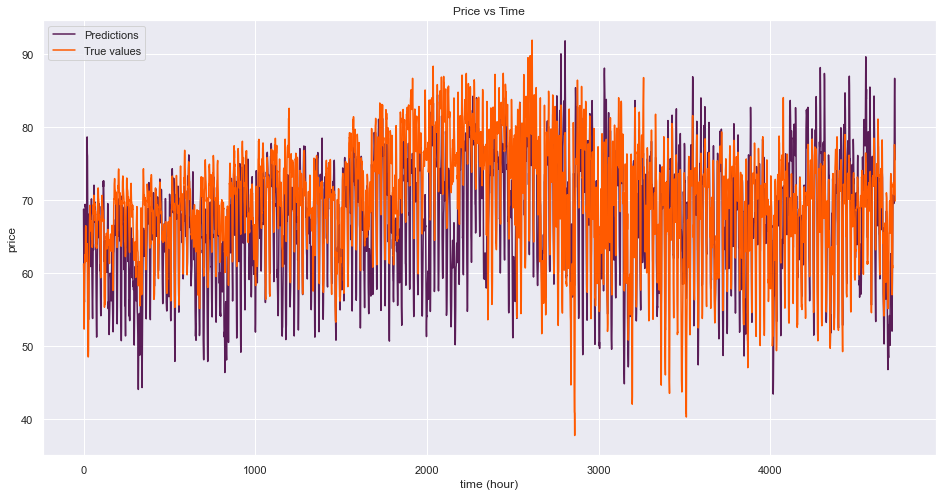

Mean Absolute Prediction Error : 13.65%


In [77]:
# Visualisation of the results

plt.figure(figsize = (16,8))
plt.plot(pred_plus, color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_plus_unscaled, color = '#ff5a00', label = 'True values')
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

MAPE_1 = np.mean(np.abs((y_test_plus_unscaled - pred_plus) /
                        y_test_plus_unscaled)) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

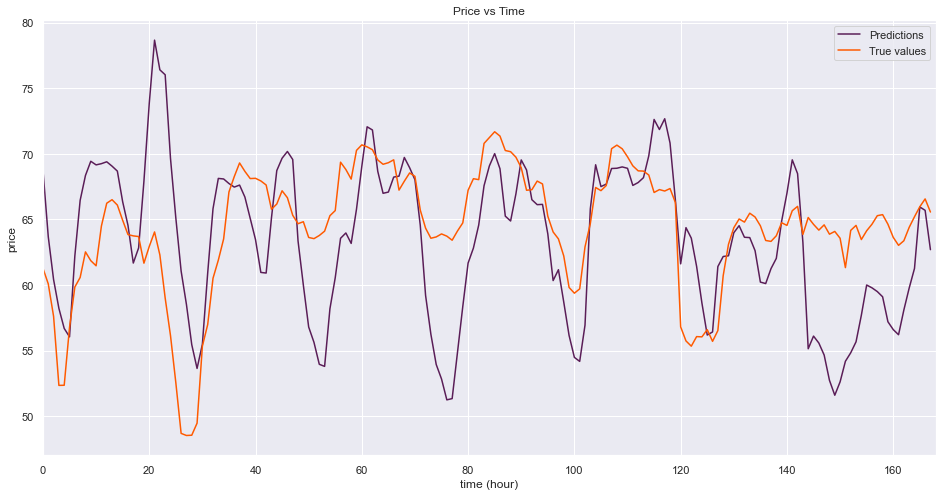

In [78]:
# Zoom on the first week predicted
i = 0

plt.figure(figsize = (16,8))
plt.plot(pred_plus[24*i:24*(i+7)], color = '#5a1d57', label = 'Predictions')
plt.plot(y_test_plus_unscaled[24*i:24*(i+7)], color = '#ff5a00', label = 'True values')
plt.xlim(0,len(pred_plus[24*i:24*(i+7)]))
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

With the same model, the results are actually not as good. However, this model can only be made with less time steps, or less datas, since 1 time step here represent one day and not one hour. Also, it provides kind of a rolling forecast 24h in advance, which might be better in real life. It would maybe need more datas and time to get very good results. Finally, we have to be cautious here since we created this model late in the project, and we did not have time to check if everything was working as expected.

### 3.3.2.7. Model comparison

In [89]:
# Comparison of MAPE, for train and test, for each model (5 models)

MAPE_test_ucnn = (
    np.mean(np.abs((y_test_ucnn_unscaled[:8568] - pred_ucnn[:8568]) / y_test_ucnn_unscaled[:8568])) * 100
)
MAPE_test_mcnn = (
    np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_mcnn[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
)
MAPE_test_mcnn_improved = (
    np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_mcnn_improved[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
)
MAPE_test_urnn = (
    np.mean(np.abs((y_test_ucnn_unscaled[:8568] - pred_urnn[:8568]) / y_test_ucnn_unscaled[:8568])) * 100
)
MAPE_test_mrnn = (
    np.mean(np.abs((y_test_mcnn_unscaled[:8568] - pred_mrnn[:8568]) / y_test_mcnn_unscaled[:8568])) * 100
)

# Now we need the same thing on the train samples
pred_train_ucnn = predict_24h_uni(X_train_ucnn, ucnn_model)
pred_train_mcnn = predict_24h_multi(X_train_mcnn, mcnn_model, 168)
pred_train_mcnn_improved = predict_24h_multi(X_train_mcnn, mcnn_improved_model, 168)
pred_train_urnn = predict_24h_uni(X_train_ucnn, urnn_model)
pred_train_mrnn = predict_24h_multi(X_train_mcnn, mrnn_model, 168)

pred_train_ucnn = np.sqrt(standard_scaler.var_[0])*np.array(pred_train_ucnn) + standard_scaler.mean_[0]
pred_train_mcnn = np.sqrt(standard_scaler.var_[0])*np.array(pred_train_mcnn) + standard_scaler.mean_[0]
pred_train_mcnn_improved = np.sqrt(standard_scaler.var_[0])*np.array(pred_train_mcnn_improved) + standard_scaler.mean_[0]
pred_train_urnn = np.sqrt(standard_scaler.var_[0])*np.array(pred_train_urnn) + standard_scaler.mean_[0]
pred_train_mrnn = np.sqrt(standard_scaler.var_[0])*np.array(pred_train_mrnn) + standard_scaler.mean_[0]

y_train_ucnn_unscaled = scaler_price.inverse_transform(np.reshape(y_train_ucnn, (-1,1)))
y_train_mcnn_unscaled = scaler_price.inverse_transform(np.reshape(y_train_mcnn, (-1,1)))

In [114]:
MAPE_train_ucnn = (
    np.mean(np.abs((y_train_ucnn_unscaled[:len(pred_train_ucnn)] - pred_train_ucnn[:len(pred_train_ucnn)]) / y_train_ucnn_unscaled[:len(pred_train_ucnn)])) * 100
)
MAPE_train_mcnn = (
    np.mean(np.abs((y_train_mcnn_unscaled[:len(pred_train_mcnn)] - pred_train_mcnn[:len(pred_train_mcnn)]) / y_train_mcnn_unscaled[:len(pred_train_mcnn)])) * 100
)
MAPE_train_mcnn_improved = (
    np.mean(np.abs((y_train_mcnn_unscaled[:len(pred_train_mcnn)] - pred_train_mcnn_improved[:len(pred_train_mcnn)]) / y_train_mcnn_unscaled[:len(pred_train_mcnn)])) * 100
)
MAPE_train_urnn = (
    np.mean(np.abs((y_train_ucnn_unscaled[:len(pred_train_ucnn)] - pred_train_urnn[:len(pred_train_ucnn)]) / y_train_ucnn_unscaled[:len(pred_train_ucnn)])) * 100
)
MAPE_train_mrnn = (
    np.mean(np.abs((y_train_mcnn_unscaled[:len(pred_train_mcnn)] - pred_train_mrnn[:len(pred_train_mcnn)]) / y_train_mcnn_unscaled[:len(pred_train_mcnn)])) * 100
)

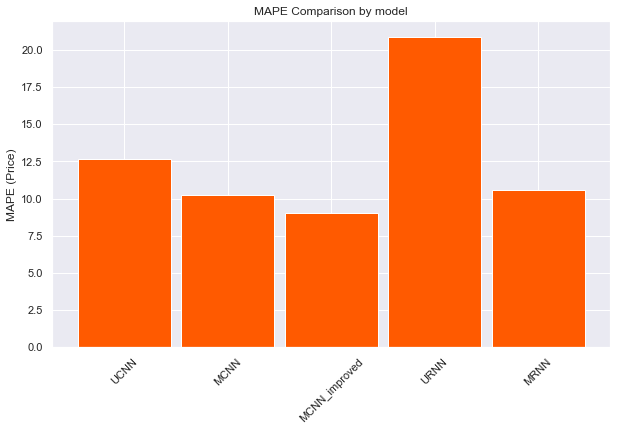

In [119]:
MAPE_test = [MAPE_test_ucnn, MAPE_test_mcnn, MAPE_test_mcnn_improved, MAPE_test_urnn, MAPE_test_mrnn]
MAPE_train = [MAPE_train_ucnn, MAPE_train_mcnn, MAPE_train_mcnn_improved, MAPE_train_urnn, MAPE_train_mrnn]

x = np.arange(len(MAPE_test))
width = 0.9
plt.figure(figsize = (10,6))
plt.title('MAPE Comparison by model')
plt.ylabel('MAPE (Price)')
plt.bar(x, MAPE_test, width, label='Test', color = '#ff5a00')
plt.xticks(ticks = x, labels = ['UCNN','MCNN', 'MCNN_improved','URNN', 'MRNN'], rotation = 45);

D:\Anaconda\lib\site-packages\pandas\core\generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


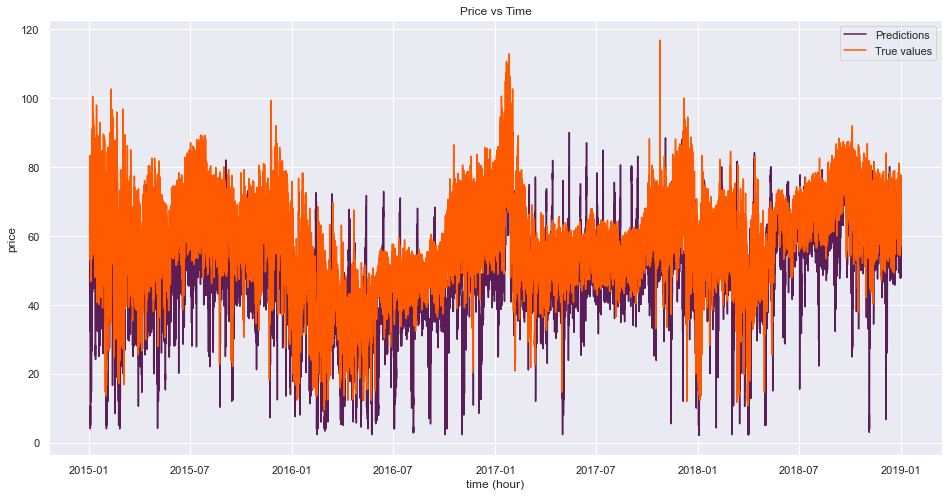

Mean Absolute Prediction Error : 21.18%


In [31]:
# Comparison with the MAPE of the forecast in the original data

energy_comparison = energy[['price_day_ahead','price_actual']]
energy_comparison.price_day_ahead = energy_comparison.price_day_ahead.shift(24)
energy_comparison = energy_comparison['2015-01-02':]

plt.figure(figsize = (16,8))
plt.plot(energy_comparison.price_day_ahead, color = '#5a1d57', label = 'Predictions')
plt.plot(energy_comparison.price_actual, color = '#ff5a00', label = 'True values')
plt.xlabel('time (hour)')
plt.ylabel('price')
plt.title('Price vs Time')
plt.legend()
plt.show()

MAPE_1 = np.mean(np.abs((energy_comparison.price_actual - energy_comparison.price_day_ahead) /
                        energy_comparison.price_actual)) * 100
print("Mean Absolute Prediction Error : %0.2f%%"% MAPE_1)

We seem to have better results with our models. However, we do not know how those forecasts were made, so it is hard to really compared. But we can definitely say we have solid models.

### 3.3.2.8. Saving models

We want to save the models so it will be easier to call them later if needed.

In [79]:
#ucnn_model.save('ucnn_model')
#mcnn_model.save('mcnn_model')
#mcnn_improved_model.save('mcnn_improved_model')
#urnn_model.save('urnn_model')
#mrnn_model.save('mrnn_model')
#plus_model.save('plus_model')

INFO:tensorflow:Assets written to: plus_model\assets


# 4. To go further...

- SARIMAX model build as is works well, but is not applicable as is : it predicts the whole 2018 year, but based on some exog parameters we are not supposed to know in advance.
- We might think of other parameters to take into acount, or create new features based on the ones we have.
- We can imagine we could have better results with more datas, especially regarding the neuronal networks models.

**Possible improvements in the code :**
- Use more functions/pipelines/script